# Forecast Future Car Count

Examining the raw .csv file, the dataset looks to be considered a 'time series' as a date column is dated from 01/01/2010 thru 06/30/2016 with days of the week also noted in another column, thus time dependent. Two numerical features, car.count & weather are included in two seperate columns, & lastly, a single categorical variable/column is included to indicate cloud coverage on the day as cloudy or clear. Googling time series forecasting, ARIMA method seems to be most common method of predicting values, so will attempt to use that.

References: 
 1. https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/
 2. https://github.com/lxu213/arima-forecasting
 3. https://medium.com/@stallonejacob/time-series-forecast-a-basic-introduction-using-python-414fcb963000

In [7]:
## Goal: Create, clean, & prepare data for Car Lot dataset

# Import Python pkgs pandas, numpy, matplotlib.pyplot, seaborn, as well as others

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy.random as nr
import math

import datetime
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA

# Keep all figures the same size

#from matplotlib.pylab import rcParams
#rcParams['figure.figsize'] = 25, 5




# Start of magic command which configures execution environment, to display graphics w/in notebook

%matplotlib inline  

In [2]:
# Load dataset, display shape, explore first 10 rows, & review data types for each column of Pandas data frame

CarLot = pd.read_csv('CarLot_data_2018-11-27.csv', header=0)
print(CarLot.shape)
print(CarLot.head(10))
print('\n Data Types:')
print(CarLot.dtypes)

(2373, 5)
         date day.of.week  car.count  weather cloud.indicator
0  2010-01-01      Friday        101      0.1           clear
1  2010-01-02    Saturday         34      0.2          cloudy
2  2010-01-03      Sunday        113      0.4           clear
3  2010-01-04      Monday          5      0.6          cloudy
4  2010-01-05     Tuesday        124      0.1           clear
5  2010-01-06   Wednesday        104     -0.1           clear
6  2010-01-07    Thursday         81     -1.0           clear
7  2010-01-08      Friday         67     -0.3          cloudy
8  2010-01-09    Saturday         89      0.2          cloudy
9  2010-01-10      Sunday        132      1.4           clear

 Data Types:
date                object
day.of.week         object
car.count            int64
weather            float64
cloud.indicator     object
dtype: object


Have a total of 5 columns & 2373 rows. Three of the columns are object types, one of the numeric columns is a float64 type, and the other numeric column is an int64 type.

The date column was reformatted in the .csv file *prior* to loading the dataset in to a YYYY-MM-DD format.

**Find missing values w/in dataset**

Can be coded as character string, numeric value like -999 or missing value NaN, or a NULL value.

 Then determine how to treat missing values.
- Remove rows w/ missing values
- Remove features w/ missing values 
- Impute by replacing values w/ mean or median using simple algorithms, or more complex ones like SMOTE or expectation maximization (EM).
- Use nearest neighbor, averaging, forward filling or backward filling.


In [3]:
# Examine which features are missing values

#(CarLot.astype(np.object) == '?').any()  # This will only work w/ strings
pd.isna(CarLot).any()
#CarLot.isnull().values.any()

date               False
day.of.week        False
car.count          False
weather            False
cloud.indicator    False
dtype: bool

In [4]:
# Examine data for duplicates by checking for unique dates

print(CarLot.shape)
print(CarLot.date.unique().shape)

(2373, 5)
(2373,)


Dataset does not seem to contain missing values in any of columns or duplicate dates.

In [5]:
# Need to read data as a time series

dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')

CarLot = pd.read_csv('CarLot_data_2018-11-27.csv', parse_dates= ['date'], index_col= 'date', date_parser= dateparse)
print(CarLot.head())

           day.of.week  car.count  weather cloud.indicator
date                                                      
2010-01-01      Friday        101      0.1           clear
2010-01-02    Saturday         34      0.2          cloudy
2010-01-03      Sunday        113      0.4           clear
2010-01-04      Monday          5      0.6          cloudy
2010-01-05     Tuesday        124      0.1           clear


Since date column reads as an object type, the data needed to be read in as a time series instead. To do that, special arguments w/in read_csv command had to be passed:

 - **parse_dates**: specifies which column contains date-time information.
 - **index_col**: specifics pandas to use a variable containing date-time information as key index for dataset.
 - **date-parser**: specifies a function which converts an input string into date-time variable. 

In [8]:
# Double-check data type of index

CarLot.index

DatetimeIndex(['2010-01-01', '2010-01-02', '2010-01-03', '2010-01-04',
               '2010-01-05', '2010-01-06', '2010-01-07', '2010-01-08',
               '2010-01-09', '2010-01-10',
               ...
               '2016-06-21', '2016-06-22', '2016-06-23', '2016-06-24',
               '2016-06-25', '2016-06-26', '2016-06-27', '2016-06-28',
               '2016-06-29', '2016-06-30'],
              dtype='datetime64[ns]', name='date', length=2373, freq=None)

In [9]:
# Explore column names
CarLot.columns

Index(['day.of.week', 'car.count', 'weather', 'cloud.indicator'], dtype='object')

In [10]:
# Can rename columns easily by assigning names to columns attribute of the data frame:

CarLot.columns = ["Weekday", "Car_Count", "Weather", "Cloud_Indicator"]
print(CarLot.columns)
print('\n Data Types')
print(CarLot.dtypes)

Index(['Weekday', 'Car_Count', 'Weather', 'Cloud_Indicator'], dtype='object')

 Data Types
Weekday             object
Car_Count            int64
Weather            float64
Cloud_Indicator     object
dtype: object


# Data Exploration & Visualization

In [11]:
# Compute & display summary statistics for numeric columns

CarLot.describe()

,Car_Count,Weather
count,2373.000000,2373.000000
mean,112.773704,0.008512
std,50.127710,1.007344
min,0.000000,-3.200000
25%,81.000000,-0.700000
50%,122.000000,0.000000
75%,152.000000,0.700000
max,239.000000,4.300000


In [12]:
# Compute & display frequency table for categorical variables w/ pandas value_counts

def count_unique(CarLot, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(CarLot[col].value_counts())
        
cat_cols = ['Weekday', 'Cloud_Indicator']
count_unique(CarLot, cat_cols)


For column Weekday
Saturday     339
Monday       339
Friday       339
Wednesday    339
Sunday       339
Thursday     339
Tuesday      339
Name: Weekday, dtype: int64

For column Cloud_Indicator
clear     1353
cloudy    1020
Name: Cloud_Indicator, dtype: int64


There are more data points for clear days than cloudy days, by 333.

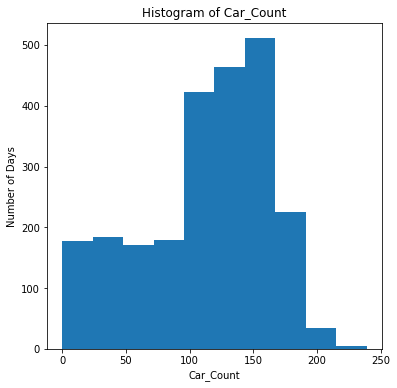

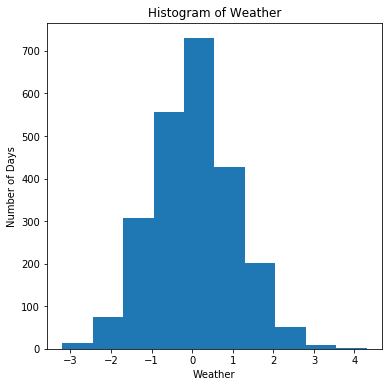

In [13]:
## Visualize Distributions w/ 1 Dimensional Plots
# Step 1- Visualize binned distributions of numerical variables w/ pandas histograms plot.hist

def plot_histogram(CarLot, cols, bins = 10):
    for col in cols:        # Iterates over list of columns
        fig = plt.figure(figsize=(6,6))    # Figure plot & axes defined using matplotlib
        ax = fig.gca()
        CarLot[col].plot.hist(ax = ax, bins = bins)    # Use plot.hist method from pandas on subset of data frame   
        ax.set_title('Histogram of ' + col)   # Give plot a main title w/ matplotlib
        ax.set_xlabel(col)    # Set x-axis labels w/ matplotlib
        ax.set_ylabel('Number of Days')   # Set y-axis label w/ matplotlib
        plt.show()
        
num_cols = ['Car_Count', 'Weather']
plot_histogram(CarLot, num_cols)      

Car_Count distribution is left-skewed & Weather distribution looks approximately Normal.

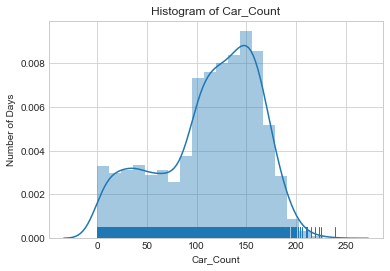

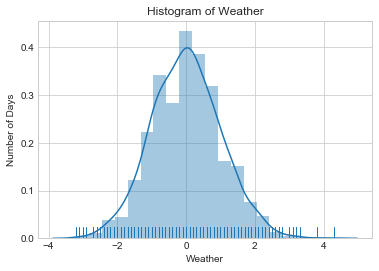

In [14]:
# Kernel Density Estimation (KDE) plots provides a smooth denisty curve of data values w/ Seaborn distplot

def plot_density_hist(CarLot, cols, bins = 10, hist = False):
    for col in cols:        # Iterates over list of columns
        sns.set_style("whitegrid")     # Set style for plot grid
        sns.distplot(CarLot[col], bins = bins, rug = True, hist = hist)    # Use distplot type w/ rug along x-axis   
        plt.title('Histogram of ' + col)   # Give plot a main title w/ matplotlib
        plt.xlabel(col)    # Set x-axis labels w/ matplotlib
        plt.ylabel('Number of Days')   # Set y-axis label w/ matplotlib
        plt.show()
        
#num_cols = ['Car_Count', 'Weather']
#plot_density_hist(CarLot, num_cols)      

# Combine histogram & KDE plots w/ Seaborn
plot_density_hist(CarLot, num_cols, bins = 20, hist = True)

In the KDEs, Car_Count look to be bimodal & Weather only has a single mode. Multimodal distributions may affect the forecasting training model.

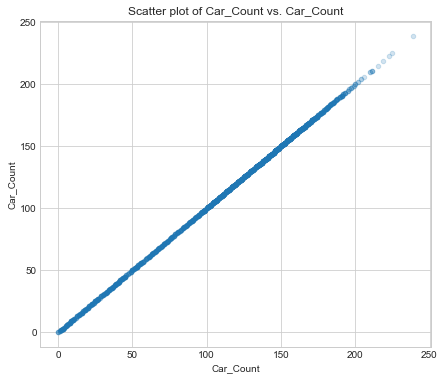

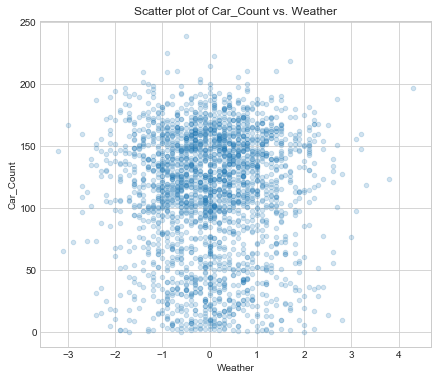

In [16]:
## Visualize distributions w/ 2 Dimensional Plots (relationship b/w 2 variables [for ML is b/w features & label])
  # Step 1- Visualize frequency distributions scatter plots of numerical features vs label w/ pandas scatter plots plot.scatter
  # Deal w/ Overplotting by using transparency

def plot_scatter_t(CarLot, cols, col_y = 'Car_Count', alpha = 1.0):
    for col in cols:        # Iterates over list of columns
        fig = plt.figure(figsize=(7,6))    # Figure plot & axis defined using matplotlib
        ax = fig.gca()
        CarLot.plot.scatter(x = col, y = col_y, ax = ax, alpha = alpha)    # Use plot.scatter method from pandas on subset of data frame   
        ax.set_title('Scatter plot of ' + col_y + ' vs. ' + col)   # Give plot a main title w/ matplotlib
        ax.set_xlabel(col)    # Set x-axis labels w/ matplotlib
        ax.set_ylabel(col_y)   # Set y-axis label w/ matplotlib
        plt.show()
        
#num_cols = ['Car_Count', 'Weather']
plot_scatter_t(CarLot, num_cols, alpha = 0.2)   # alpha=0.2 is high transparency    

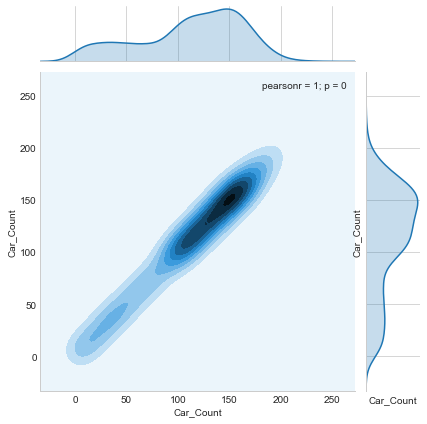

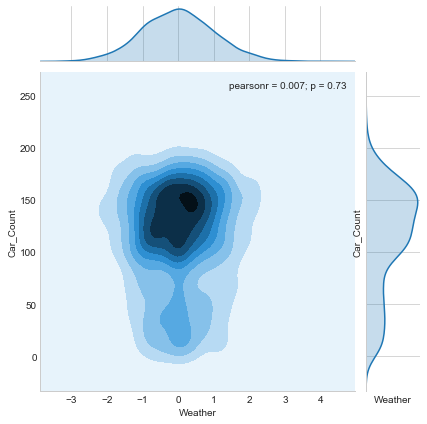

In [17]:
# Also deal w/ Overplotting by using Countour plots or 2-D Density Plots w/ Seaborn jointplot

def plot_density_2d(CarLot, cols, col_y = 'Car_Count', kind = 'kde'):
    for col in cols:   # Iterates over list of columns
        sns.set_style("whitegrid")   # Set style for plot grid
        sns.jointplot(col, col_y, data = CarLot, kind = kind)   # Use jointplot type from seaborn 
        plt.xlabel(col)   # Set x-axis label w/ matplotlib
        plt.ylabel (col_y)   # Set y-axis label w/ matplotlib
        plt.show()
        
plot_density_2d(CarLot, num_cols)   # Displays 1-D KDE plot slong w/ contour plot showing 2-D Density

Shows 2-D multi-modal behavior for Car_Count & Weather.

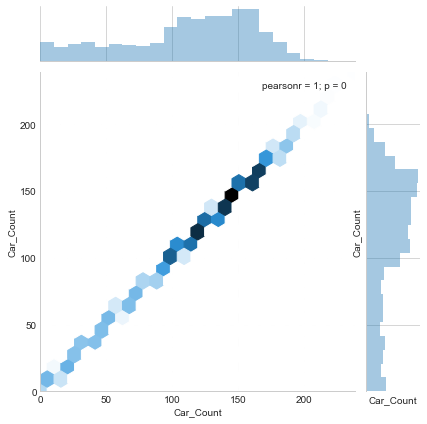

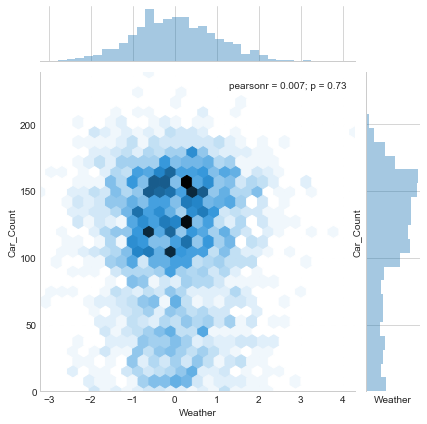

In [18]:
# Another View to Deal w/ Overplotting by using Hexbin plots

plot_density_2d(CarLot, num_cols, kind = 'hex')   #Hexbin shows density of points as 2-D histogram and 1-D histogram of each variable

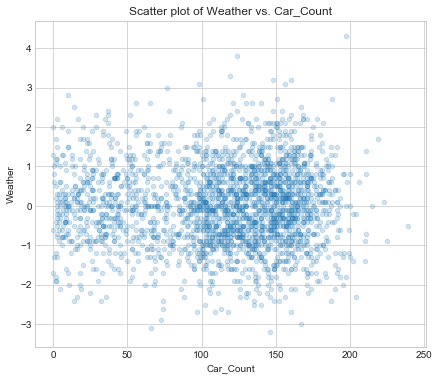

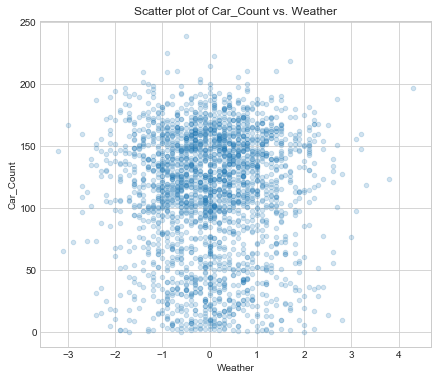

In [23]:
# Test if Car_Count & Weather could be colinear numerical features

plot_scatter_t(CarLot, ['Car_Count'], 'Weather', alpha = 0.2)

plot_scatter_t(CarLot, ['Weather'], 'Car_Count', alpha = 0.2)


No relationship is observed between feature = Weather & label = Car_Count. Thus Weather does not seem important for forecasting Car_count.

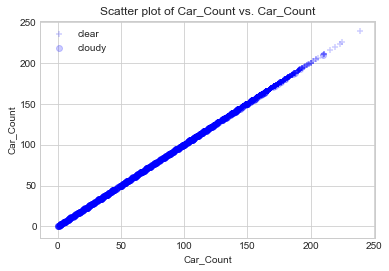

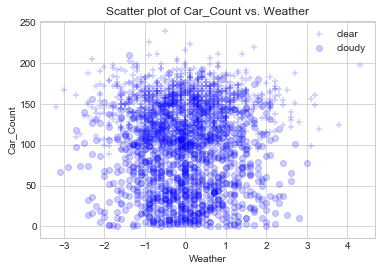

In [24]:
## Additional Dimensions to Plots Using Aethetics
   # Marker Shape - must use varying distinct shapes

def plot_scatter_shape(CarLot, cols, shape_col = 'Cloud_Indicator', col_y = 'Car_Count', alpha = 0.2):
    shapes = ['+', 'o', 's', 'x', '^']     # pick distinct shapes
    unique_cats = CarLot[shape_col].unique()
    for col in cols:    # loop over columns in order to plot
        sns.set_style("whitegrid")
        for i, cat in enumerate(unique_cats):      # loop over unique categories
            temp = CarLot[CarLot[shape_col] == cat]
            sns.regplot(col, col_y, data = temp, marker = shapes[i], label = cat,
                        scatter_kws = {"alpha":alpha}, fit_reg = False, color = 'blue')     #Matplotlib dictonary for transparency, the key is argument, alpha, and the value is the argument value
        plt.title('Scatter plot of ' + col_y + ' vs. ' + col)     # Title for plot
        plt.xlabel(col)     # Label for x-axis
        plt.ylabel(col_y)     # Label for y-axis
        plt.legend()     # Legend for plot
        plt.show()
        
#num_cols = ['Car_Count', 'Weather']
plot_scatter_shape(CarLot, num_cols)

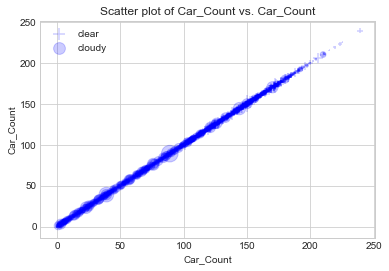

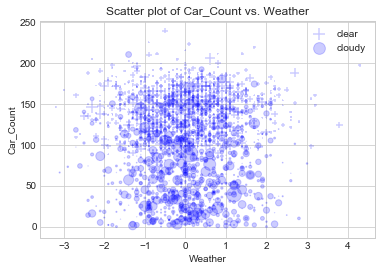

In [25]:
# Can add another dimension w/ Marker Size

def plot_scatter_size(CarLot, cols, shape_col = 'Cloud_Indicator', size_col = 'Weather',
                      size_mul = 15, col_y = 'Car_Count', alpha = 0.2):     # Size is scaled by squaring and multiplied by convient multiplier in Matplotlib since it typically uses area (below).
    shapes = ['+', 'o', 's', 'x', '^']     # use distinct shapes
    unique_cats = CarLot[shape_col].unique()
    for col in cols:     #loops over all columns to plot
        sns.set_style("whitegrid")
        for i, cat in enumerate(unique_cats):     # Loops over unique categories
            temp = CarLot[CarLot[shape_col] == cat]
            sns.regplot(col, col_y, data = temp, marker = shapes[i], label = cat,
                        scatter_kws = {"alpha":alpha, "s":size_mul*CarLot[size_col]**2},
                        fit_reg = False, color = 'blue')     #Matplotlib dictonary for transparency, the key is argument, alpha, and the value is the argument value.
        plt.title('Scatter plot of ' + col_y + ' vs. ' + col)     # Label plot w/ title
        plt.xlabel(col)     # Label x-axis
        plt.ylabel(col_y)     # Label y-axis
        plt.legend()     # Ledgend for plot
        plt.show()
        
plot_scatter_size(CarLot, num_cols)

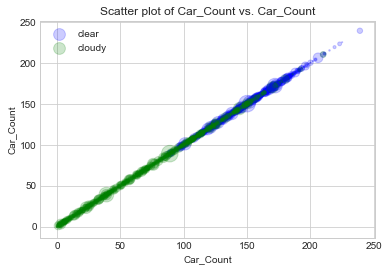

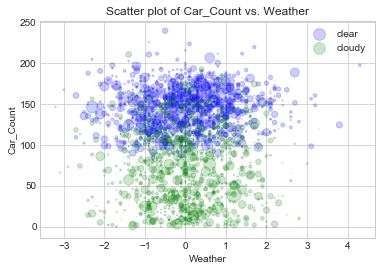

In [26]:
# Color in scatter plots (remember some people are green-red color blind)

def plot_scatter_size_col(CarLot, cols, size_col = 'Weather',
                      size_mul = 15, color_col = 'Cloud_Indicator', col_y = 'Car_Count', alpha = 0.2):     # Size is scaled by squaring and multiplied by convient multiplier in Matplotlib since it typically uses area (below).
    colors = ['blue', 'green', 'orange', 'magenta', 'gray']     # Use distint colors
    unique_colors = CarLot[color_col].unique()
    for col in cols:     #loops over all columns to plot
        sns.set_style("whitegrid")
        for i, color in enumerate(unique_colors):    # Loops over unique colors
            temp = CarLot[(CarLot[color_col] == color)]
            sns.regplot(col, col_y, data = temp,  
                        scatter_kws = {"alpha":alpha, "s":size_mul*CarLot[size_col]**2},
                        label = (color), fit_reg = False, color = colors[i])     #Matplotlib dictonary for transparency, the key is argument, alpha, and the value is the argument value.
        plt.title('Scatter plot of ' + col_y + ' vs. ' + col)     # Label plot w/ title
        plt.xlabel(col)     # Label x-axis
        plt.ylabel(col_y)     # Label y-axis
        plt.legend()     # Ledgend for plot
        plt.show()
        
plot_scatter_size_col(CarLot, num_cols)

Colors help to more to see the 'clear' & 'cloudy' data points in the scatter plot.

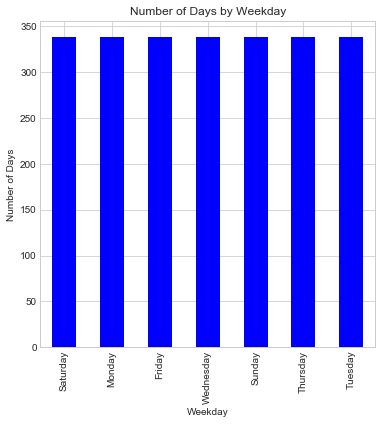

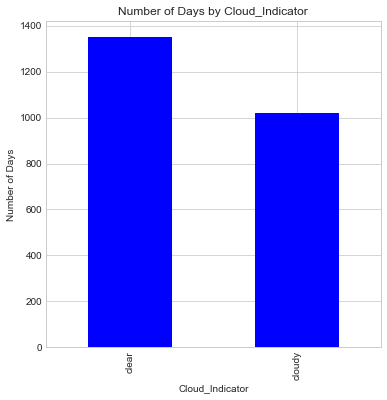

In [27]:
## Visualize distributions w/ 1 Dimensional Plots
# Step 2- Visualize frequency distributions of categorical variables w/ pandas Bar Chart plot.bar

def plot_bars(CarLot, cols):
    for col in cols:        # Iterates over list of columns
        fig = plt.figure(figsize=(6,6))    # Figure plot & axes defined using matplotlib
        ax = fig.gca()
        counts = CarLot[col].value_counts()    # Find counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue')    # Use plot.bar method from pandas on counts data frame
        ax.set_title('Number of Days by ' + col)   # Give plot a main title w/ matplotlib
        ax.set_xlabel(col)    # Set x-axis labels w/ matplotlib
        ax.set_ylabel('Number of Days')   # Set y-axis label w/ matplotlib
        plt.show()
        
plot_cols = ['Weekday', 'Cloud_Indicator']
plot_bars(CarLot, plot_cols)    

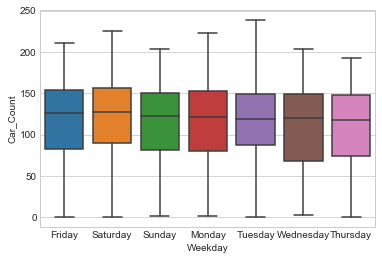

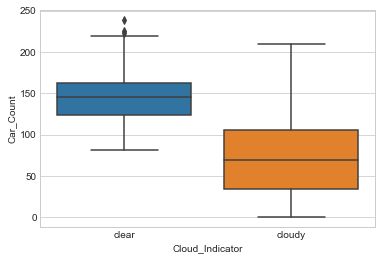

In [28]:
# Plot Categorical & Numerical Varibles w/ Seaborn boxplot
  # Shows inner two quartiles w/in the box. Length of box shows interquartile range.
  # Line w/in box shows median. Whiskers are 1.5 times the interquartile range (extreme values).
  # Outliers are just a symbol

def plot_box(CarLot, cols, col_y = 'Car_Count'):
    for col in cols:   # Iterates over list of columns
        sns.set_style("whitegrid")   # Set style for plot grid
        sns.boxplot(col, col_y, data = CarLot)   # Use boxplot method from seaborn 
        plt.xlabel(col)   # Set x-axis label w/ matplotlib
        plt.ylabel(col_y)   # Set y-axis label w/ matplotlib
        plt.show()
        
cat_cols = ['Weekday', 'Cloud_Indicator']
plot_box(CarLot, cat_cols)

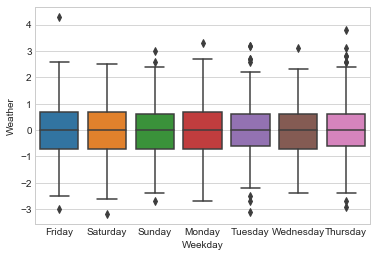

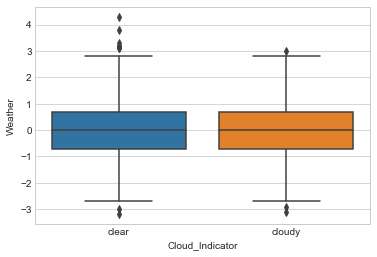

In [29]:
# Check if any categorical relationship w/ Weather

def plot_box(CarLot, cols, col_y = 'Weather'):
    for col in cols:   # Iterates over list of columns
        sns.set_style("whitegrid")   # Set style for plot grid
        sns.boxplot(col, col_y, data = CarLot)   # Use boxplot method from seaborn 
        plt.xlabel(col)   # Set x-axis label w/ matplotlib
        plt.ylabel(col_y)   # Set y-axis label w/ matplotlib
        plt.show()
        
cat_cols = ['Weekday', 'Cloud_Indicator']
plot_box(CarLot, cat_cols)

Does not look like any relationships b/w Weather & Weekday or Cloud_Indicator exist.

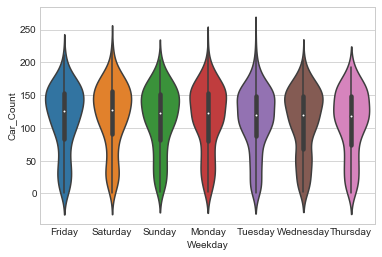

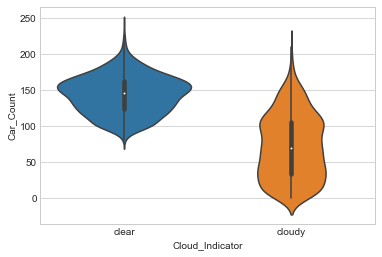

In [30]:
# Plot Categorical & Numerical Variables w/ Seaborn Violin Plots

def plot_violin(CarLot, cols, col_y = 'Car_Count'):
    for col in cols:   # Iterates over list of columns
        sns.set_style("whitegrid")   # Set style for plot grid
        sns.violinplot(col, col_y, data = CarLot)   # Use boxplot method from seaborn 
        plt.xlabel(col)   # Set x-axis label w/ matplotlib
        plt.ylabel(col_y)   # Set y-axis label w/ matplotlib
        plt.show()
        
#cat_cols = ['Weekday', 'Cloud_Indicator']
plot_violin(CarLot, cat_cols)

Weekday does not seem to have a relationship w/ Car_Count but there are less car counts on cloudy days than clear days. Thus, Cloud_Indicator is an important feature for determining Car_Count.

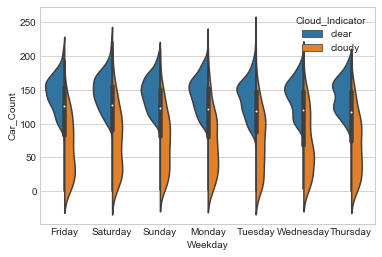

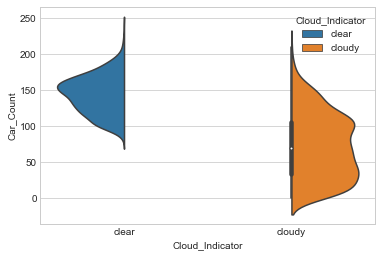

In [31]:
# Color(hue) in split violin plots

def plot_violin_hue(CarLot, cols, col_y = 'Car_Count', hue_col = 'Cloud_Indicator'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data = CarLot, hue = hue_col, split = True)
        plt.xlabel(col)     # Label x-axis
        plt.ylabel(col_y)     # Label y-axis
        plt.show()
        
plot_violin_hue(CarLot, cat_cols)

There are differences in Cloud_Indicator but not Weekday. Thus Cloud_Indicator is important for predicting Car_Count while Weekday is not important.

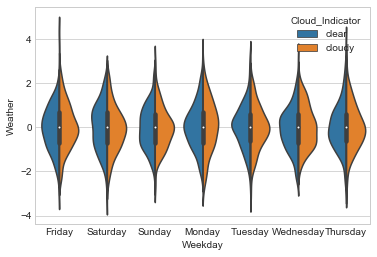

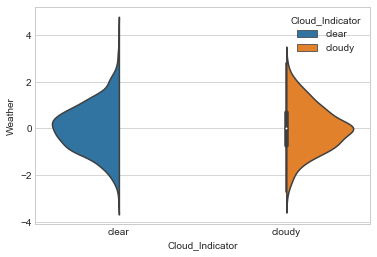

In [32]:
# Color(hue) in split violin plots w/ Weather

def plot_violin_hue(CarLot, cols, col_y = 'Weather', hue_col = 'Cloud_Indicator'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data = CarLot, hue = hue_col, split = True)
        plt.xlabel(col)     # Label x-axis
        plt.ylabel(col_y)     # Label y-axis
        plt.show()
        
plot_violin_hue(CarLot, cat_cols)

'Cloud_Indicator'

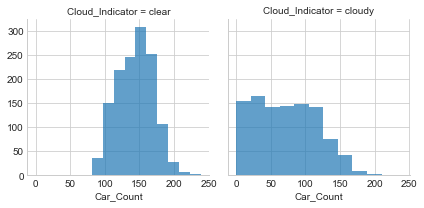

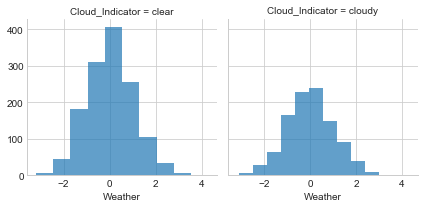

In [33]:
## Conditioned (group-by operation) Histogram Plots using matplotlib & seaborn

# Function to plot conditioned histograms
def cond_hists(df, plot_cols, grid_col):
    import matplotlib.pyplot as plt
    import seaborn as sns
    # loop over the list of columns
    for col in plot_cols:
        grid1 = sns.FacetGrid(df, col=grid_col)     # Defines grid object over which plots are displayed, argument is Pandas dataframe & grouping variables for rows & columns
        grid1.map(plt.hist, col, alpha = 0.7)     # Map method displays/maps the histogram plot function over plot grid.
    return grid_col

# Define numerical columns for making a conditioned histogram
plot_cols2 = ['Car_Count', 'Weather']

cond_hists(CarLot, plot_cols2, 'Cloud_Indicator')

Distibutions of Car_Count are different between clear & cloudy days. Since the general distribution of Car_Count was left-skewed a transformation will be needed to help get back toward normality.

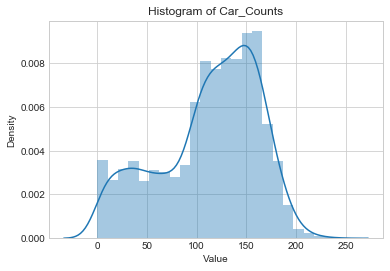

In [34]:
# Display current histogram & distribution of Car_Count

def hist_plot(vals, lab):
    sns.distplot(vals)  #distribution plot of values
    plt.title('Histogram of ' + lab)
    plt.xlabel('Value')   #Label of x-axis
    plt.ylabel('Density')  #Label of y-axis
    
hist_plot(CarLot['Car_Count'], 'Car_Counts')

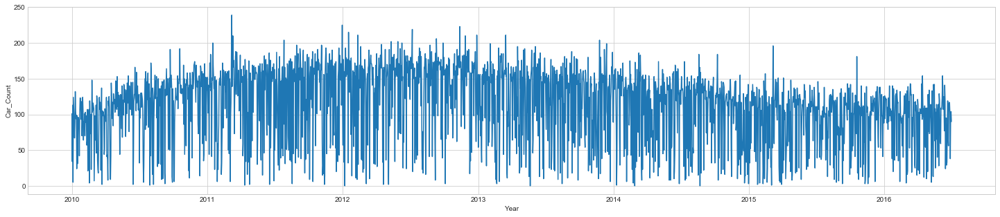

In [37]:
# plot Car_Count over all years

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Car_Count')
plt.plot(CarLot.index, CarLot['Car_Count'])

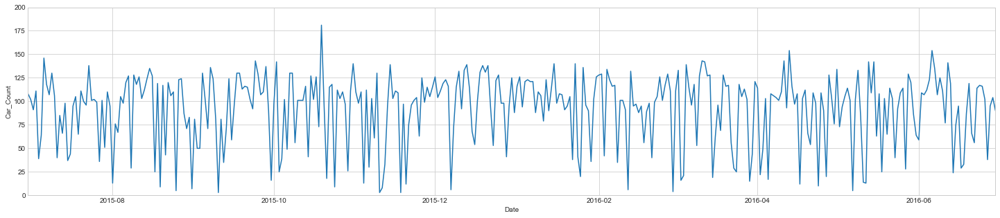

In [38]:
# What does this look like up closer?
# Examine last year of Car-Count

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylim(0, 200)
ax.set_ylabel('Car_Count')
plt.plot(CarLot.index, CarLot['Car_Count'])

Almost looks like there might be a wavy pattern w/in the year of Car_Count. Could be seasonal, due to weather, or every other month?? Make note of this.

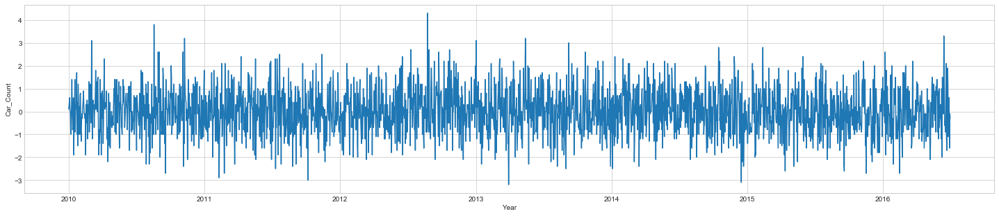

In [39]:
# plot Weather over all years

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Car_Count')
plt.plot(CarLot.index, CarLot['Weather'])


The Weather data looks to be standardized/scaled as most data is b/w +4 & -3.5. Remember this distribution looked approximately normal & didn't look like it was important for forecasting.

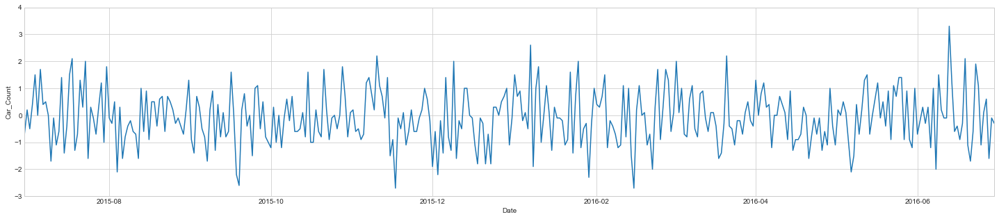

In [40]:
# What does this look like up closer?
# Examine last year of Weather

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylim(-3, 4)
ax.set_ylabel('Car_Count')
plt.plot(CarLot.index, CarLot['Weather'])

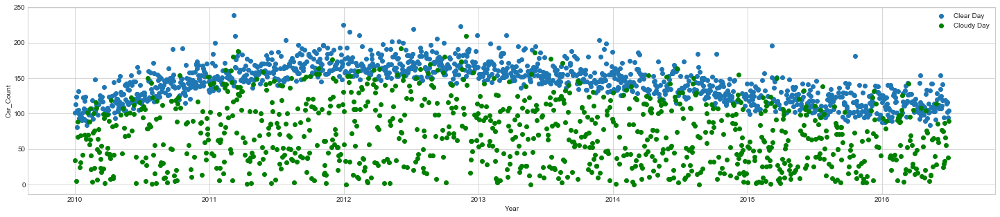

In [41]:
# plot Car_Count over all years w/ respect to Cloud_Indicator

cloudy = CarLot.loc[(CarLot['Cloud_Indicator'] == 'cloudy')]
clear = CarLot.loc[(CarLot['Cloud_Indicator'] == 'clear')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Car_Count')
plt.scatter(clear.index, clear['Car_Count'])  
plt.scatter(cloudy.index, cloudy['Car_Count'], color='green');     
ax.legend(['Clear Day', 'Cloudy Day'])

Cloud_Indicator also looks to have a wave pattern to it, but less frequent. Cloudy days seem to have smaller Car_Count values than on clear days. I am assuming this is due to poor visibility of parking lot on cloudy days, which can affect Car-Count numbers. Cloud_Indicator is important for forecasting Car_Count.

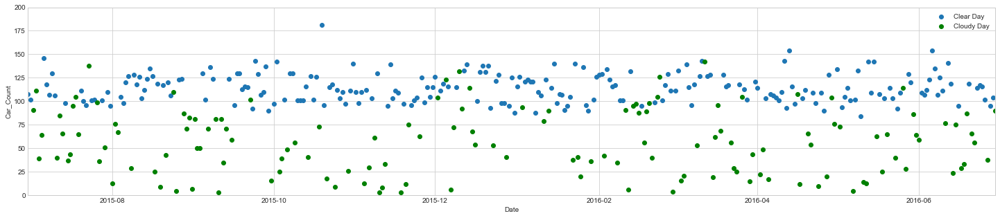

In [42]:
# What does this look like up closer?
# Examine last year of Car_Count w/ Cloud_Indicator

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

cloudy_day = CarLot.loc[(CarLot['Cloud_Indicator'] == 'cloudy')]
clear_day = CarLot.loc[(CarLot['Cloud_Indicator'] == 'clear')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylim(0, 200)
ax.set_ylabel('Car_Count')
plt.scatter(clear_day.index, clear_day['Car_Count'])  
plt.scatter(cloudy_day.index, cloudy_day['Car_Count'], color='green');     
ax.legend(['Clear Day', 'Cloudy Day'])

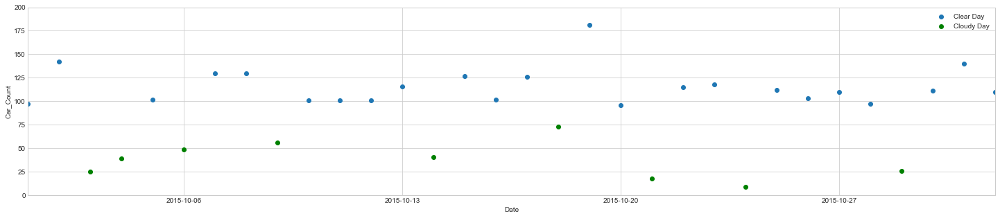

In [43]:
# What does this look like up even closer?
# Examine a month of Car_Count w/ Cloud_Indicator

start = datetime.date(2015,10,1)
end = datetime.date(2015,11,1)

cloudy_day = CarLot.loc[(CarLot['Cloud_Indicator'] == 'cloudy')]
clear_day = CarLot.loc[(CarLot['Cloud_Indicator'] == 'clear')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylim(0, 200)
ax.set_ylabel('Car_Count')
plt.scatter(clear_day.index, clear_day['Car_Count'])  
plt.scatter(cloudy_day.index, cloudy_day['Car_Count'], color='green');     
ax.legend(['Clear Day', 'Cloudy Day'])

Can visually see big variations in values, that a clear day can have ~177 cars and then a few days later have ~20 cars on a cloudy day.

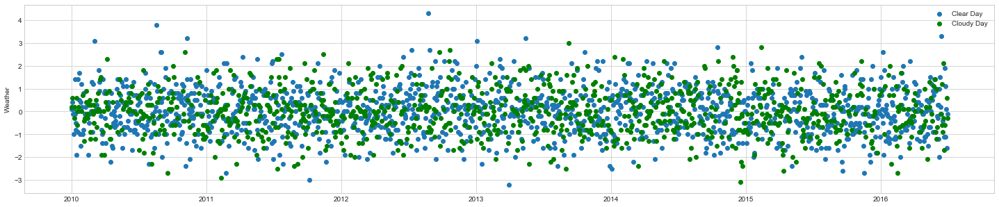

In [44]:
# What does Cloud_Indicator & Weather look like together for all years?

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_ylabel('Date')
ax.set_ylabel('Weather')
plt.scatter(clear.index, clear['Weather'])  
plt.scatter(cloudy.index, cloudy['Weather'], color='green');     
ax.legend(['Clear Day', 'Cloudy Day'])

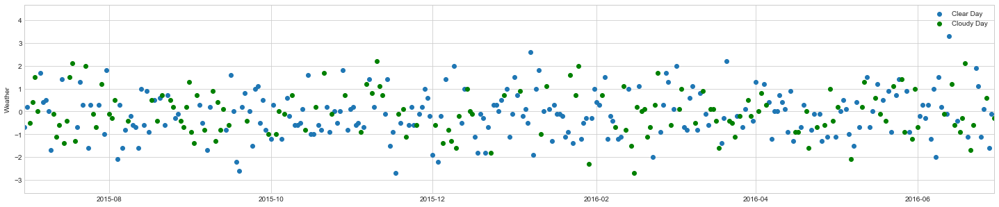

In [45]:
# What does this look like up closer?
# What does Cloud_Indicator & Weather look like together for all years?

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_ylabel('Date')
ax.set_ylabel('Weather')
plt.scatter(clear.index, clear['Weather'])  
plt.scatter(cloudy.index, cloudy['Weather'], color='green');     
ax.legend(['Clear Day', 'Cloudy Day'])

Does not seem like there is a pattern b/w Weather & Cloud_Indicator. Weather still not important for forecasting Car_Count.

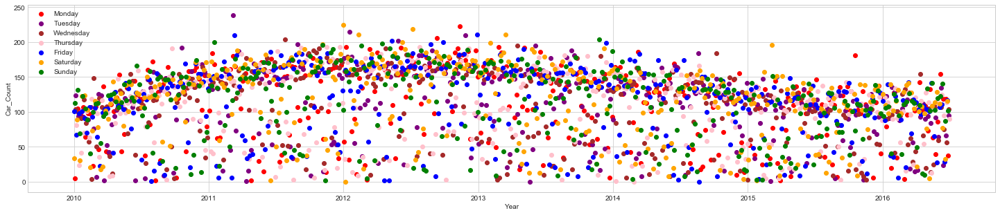

In [46]:
# plot Car_Count over all years in respect to Weekday


Mon = CarLot.loc[(CarLot['Weekday'] == 'Monday')]
Tues = CarLot.loc[(CarLot['Weekday'] == 'Tuesday')]
Weds = CarLot.loc[(CarLot['Weekday'] == 'Wednesday')]
Thurs = CarLot.loc[(CarLot['Weekday'] == 'Thursday')]
Fri = CarLot.loc[(CarLot['Weekday'] == 'Friday')]
Sat = CarLot.loc[(CarLot['Weekday'] == 'Saturday')]
Sun = CarLot.loc[(CarLot['Weekday'] == 'Sunday')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlabel('Year')
ax.set_ylabel('Car_Count')
plt.scatter(Mon.index, Mon['Car_Count'], color='red')  
plt.scatter(Tues.index, Tues['Car_Count'], color='purple') 
plt.scatter(Weds.index, Weds['Car_Count'], color='brown')
plt.scatter(Thurs.index, Thurs['Car_Count'], color='pink')
plt.scatter(Fri.index, Fri['Car_Count'], color='blue')
plt.scatter(Sat.index, Sat['Car_Count'], color='orange')
plt.scatter(Sun.index, Sun['Car_Count'], color='green');
ax.legend(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

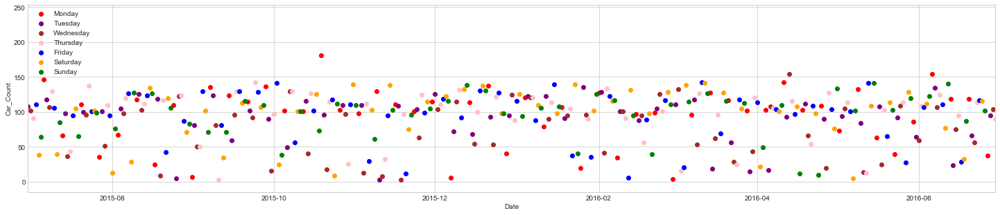

In [47]:
# What does this look like up closer?
# plot Car_Count over the last year in respect to Weekday

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

Mon = CarLot.loc[(CarLot['Weekday'] == 'Monday')]
Tues = CarLot.loc[(CarLot['Weekday'] == 'Tuesday')]
Weds = CarLot.loc[(CarLot['Weekday'] == 'Wednesday')]
Thurs = CarLot.loc[(CarLot['Weekday'] == 'Thursday')]
Fri = CarLot.loc[(CarLot['Weekday'] == 'Friday')]
Sat = CarLot.loc[(CarLot['Weekday'] == 'Saturday')]
Sun = CarLot.loc[(CarLot['Weekday'] == 'Sunday')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylabel('Car_Count')
plt.scatter(Mon.index, Mon['Car_Count'], color='red')  
plt.scatter(Tues.index, Tues['Car_Count'], color='purple') 
plt.scatter(Weds.index, Weds['Car_Count'], color='brown')
plt.scatter(Thurs.index, Thurs['Car_Count'], color='pink')
plt.scatter(Fri.index, Fri['Car_Count'], color='blue')
plt.scatter(Sat.index, Sat['Car_Count'], color='orange')
plt.scatter(Sun.index, Sun['Car_Count'], color='green');
ax.legend(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

No pattern emerges, weather still not important.

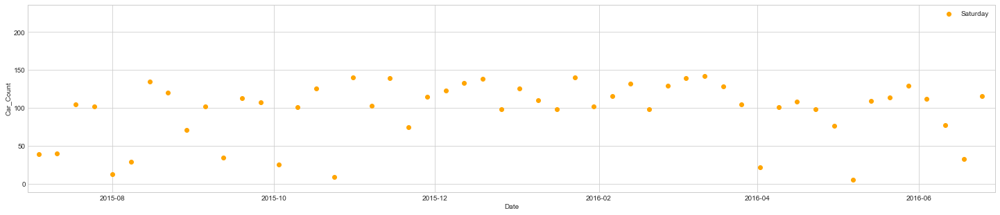

In [48]:
# What does this look like up even closer for a particular weekday?
# plot Car_Count over the last year in respect to Saturday

start = datetime.date(2015,6,30)
end = datetime.date(2016,6,30)

#Mon = CarLot.loc[(CarLot['Weekday'] == 'Monday')]
#Tues = CarLot.loc[(CarLot['Weekday'] == 'Tuesday')]
#Weds = CarLot.loc[(CarLot['Weekday'] == 'Wednesday')]
#Thurs = CarLot.loc[(CarLot['Weekday'] == 'Thursday')]
#Fri = CarLot.loc[(CarLot['Weekday'] == 'Friday')]
Sat = CarLot.loc[(CarLot['Weekday'] == 'Saturday')]
#Sun = CarLot.loc[(CarLot['Weekday'] == 'Sunday')]

plt.figure(figsize=(25,5))
ax = plt.gca()
ax.set_xlim(start, end)
ax.set_xlabel('Date')
ax.set_ylabel('Car_Count')
#plt.scatter(Mon.index, Mon['Car_Count'], color='red')  
#plt.scatter(Tues.index, Tues['Car_Count'], color='purple') 
#plt.scatter(Weds.index, Weds['Car_Count'], color='brown')
#plt.scatter(Thurs.index, Thurs['Car_Count'], color='pink')
#plt.scatter(Fri.index, Fri['Car_Count'], color='blue')
plt.scatter(Sat.index, Sat['Car_Count'], color='orange')
#plt.scatter(Sun.index, Sun['Car_Count'], color='green');
ax.legend(['Saturday'])

Again, seeing a potential wave pattern within Saturday data from the last year, but of data doesn't seem to have any relationship or pattern. Still assuming that Weekday is not important for forecasting Car_Count also.

# Checking for Stationarity - All Data

Before forecasting can be performed, a check for stationarity is required. A time series assumption is that its mean & variance should remain constant over time for it to be considered **stationary**. Specifically, the crition for the constant statisitical properties over time are as follows:
- constant mean
- constant variance
- an autocovariance that does *not* depend on time

Can check for stationarity using:
 1. Rolling Statisitcs Plot -Plot moving average or moving variance to visually see if it varies over time.
 2. Dickey-Fuller Test -Uses null hypothesis (H0) that the time series is non-stationary. If the test statistic is < Critical Value, can reject H0 & say that time series is stationary.


(The following code is done two different ways as a verification of each other.)

In [49]:
# Dickey-Fuller Stationarity Test 1 - all data

from statsmodels.tsa.stattools import adfuller
def test_stationarity1(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    #Plot rolling statistics:
    plt.figure(figsize=(25,5))
    ax = plt.gca()
    ax.set_xlabel('Year')
    ax.set_ylabel('Car_Count')
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


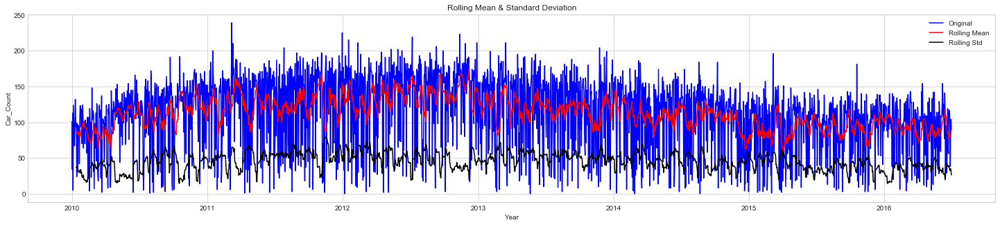

Results of Dickey-Fuller Test:
Test Statistic                   -4.400166
p-value                           0.000297
#Lags Used                       27.000000
Number of Observations Used    2345.000000
Critical Value (1%)              -3.433142
Critical Value (5%)              -2.862773
Critical Value (10%)             -2.567427
dtype: float64


In [50]:
test_stationarity1(CarLot['Car_Count'])

Standard deviation was plotted instead of vairance to maintain similiar units to mean. 

The test statistic of -4.4 is less than the critical value(s). Thus we can reject null hypothesis (H0) to say that the time series is stationary with 99% confidence. The rolling mean looks somewhat consistent hovering around ~100 line over the time series, while the rolling standard deviation is also hovering just at & under ~50 line. Neither of them seem to increase or decrease w/ time.

In [51]:
# Dickey-Fuller Stationarity Test 2 - all data

def test_stationarity2(ts):
    stats = ['Test Statistic','p-value','Lags','Observations']
    df_test = adfuller(ts, autolag='AIC')
    df_results = pd.Series(df_test[0:4], index=stats)
    for key,value in df_test[4].items():
        df_results['Critical Value (%s)'%key] = value
    print(df_results)

In [52]:
test_stationarity2(CarLot['Car_Count'])

Test Statistic            -4.400166
p-value                    0.000297
Lags                      27.000000
Observations            2345.000000
Critical Value (1%)       -3.433142
Critical Value (5%)       -2.862773
Critical Value (10%)      -2.567427
dtype: float64


# Forcasting Time Series w/ ARIMA - All Data

**Auto-Regressive Integrated Moving Averages** uses 3 predicition parameters:
 - Number of AR terms (Auto-Regression), *p*: the lags of dependent variable.
 - Number of Differences, *d*: the number of non-seasonal differences.
 - Number of MA terms (Moving Average), *q*: the lagged forecast errors in prediction equation.
 
In order to determine values for *p* & *q*, two different plots will help. These must be done after differencing, if needed.
 1. **Autocorrelation Function (ACF)**: the measure of correlation b/w the time series & a specific lagged version of itself.
 2. **Partial Autocorrelation Function (PACF)**: the measure of correlation b/w the time series & a specific lagged version of itself, BUT after eliminating variations already explained by intervening comparisions from previous lags.

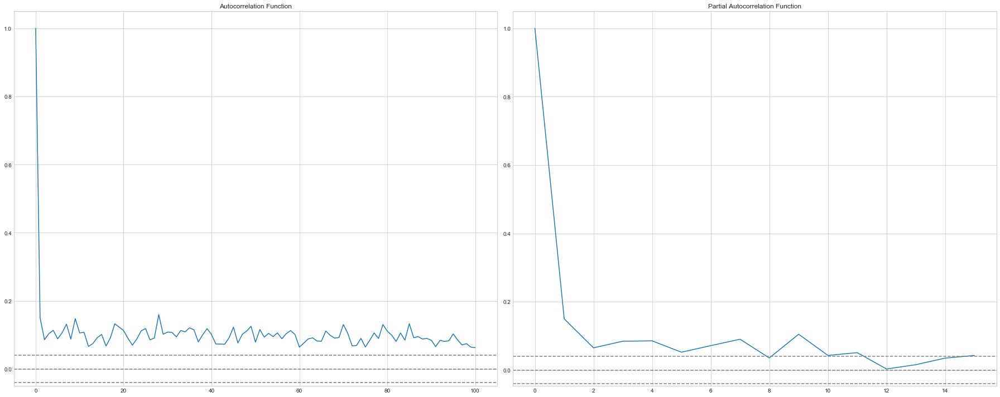

In [53]:
# ARIMA ACF and PACF plots: - all data

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf  

lag_acf = acf(CarLot['Car_Count'], nlags=100)
lag_pacf = pacf(CarLot['Car_Count'], nlags=15, method='ols')
plt.figure(figsize=(25,10))


#Plot ACF:    
ax.set_ylim(-0.2, 0.2)
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(CarLot['Car_Count'])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(CarLot['Car_Count'])),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
ax.set_ylim(-0.2, 0.2)
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(CarLot['Car_Count'])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(CarLot['Car_Count'])),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

Where the PACF & ACF crosses the upper confidence interval (top dashed line) are the values needed for *p* & *q*, respectively. The value of *p*, lag value of **ACF (p) is 0**, where the PACF line never crosses the upper confidence limit. The value of *q*, lag value of **PACF (q) is 8** which is the first point the ACF line crosses the upper confidence limit. (p,d,q) therefore (0,0,8)

Text(0.5,1,'RSS: 5960331.4791')

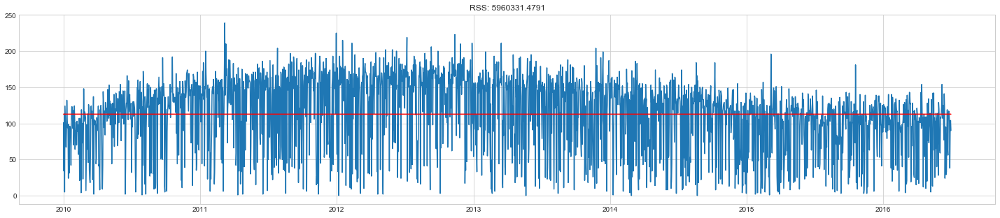

In [54]:
# AR Model (p=0) - all data

float_CarCount = CarLot['Car_Count'].astype('float32')

model = ARIMA(float_CarCount, order=(0, 0, 0))  
results_AR = model.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(CarLot['Car_Count'])
plt.plot(results_AR.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR.fittedvalues-CarLot['Car_Count'])**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 5688549.8915')

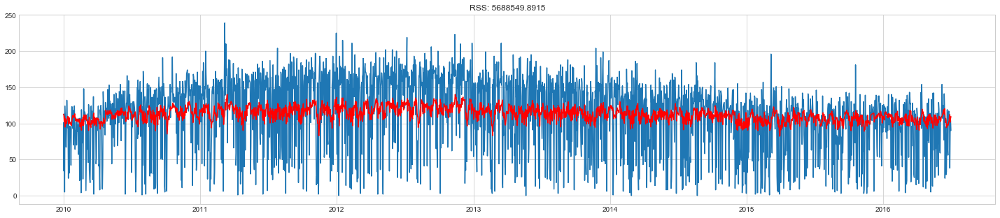

In [55]:
# MA Model (q=8) - all data

float_CarCount = CarLot['Car_Count'].astype('float32')

model = ARIMA(float_CarCount, order=(0, 0, 8))  
results_MA = model.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(CarLot['Car_Count'])
plt.plot(results_MA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA.fittedvalues-CarLot['Car_Count'])**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 5600855.4566')

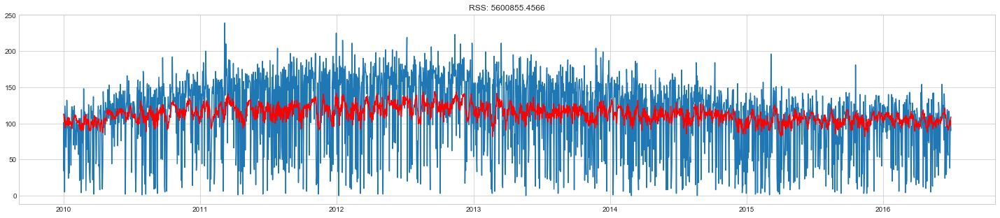

In [56]:
# MA Model (q=12) - all data

float_CarCount = CarLot['Car_Count'].astype('float32')

model = ARIMA(float_CarCount, order=(0, 0, 12))  
results_MA = model.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(CarLot['Car_Count'])
plt.plot(results_MA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA.fittedvalues-CarLot['Car_Count'])**2))

Since it is difficult to say whether or not the PACF crosses the upper limit at 8 or 12, I checked both. The RSS value is lower for q=12 (5600855.4566) than for q=8 (5688549.8915), I'll go forward with q=12 for the lag value to cross the upper CI for the combine ARIMA prediction model.

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 5600855.4566')

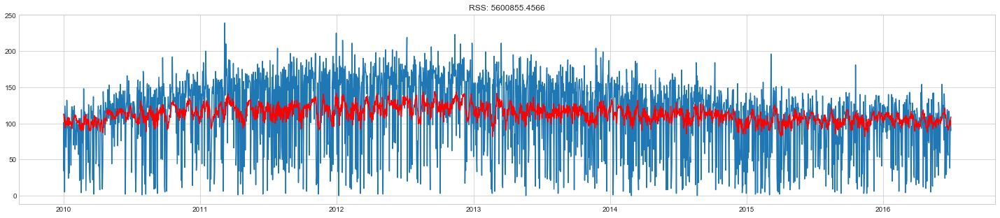

In [57]:
# Combined ARIMA Model (p,d,q) = (0,0,12)  - all data

float_CarCount = CarLot['Car_Count'].astype('float32')

model = ARIMA(float_CarCount, order=(0, 0, 12))  
results_ARIMA = model.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(CarLot['Car_Count'])
plt.plot(results_ARIMA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA.fittedvalues-CarLot['Car_Count'])**2))


In [58]:
# Save prediction results - all data

predictions_ARIMA = pd.Series(results_ARIMA.fittedvalues, copy=True)
print(predictions_ARIMA.head())

date
2010-01-01    112.720005
2010-01-02    111.097946
2010-01-03    101.780762
2010-01-04    108.426169
2010-01-05     93.827276
dtype: float64


Text(0.5,1,'RMSE: 48.5823')

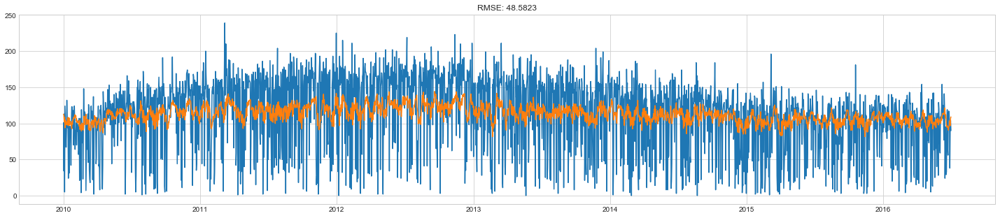

In [59]:
# Prediction Plot - all data

plt.figure(figsize=(25,5))
plt.plot(CarLot['Car_Count'])
plt.plot(predictions_ARIMA)
plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA-CarLot['Car_Count'])**2)/len(CarLot['Car_Count'])))

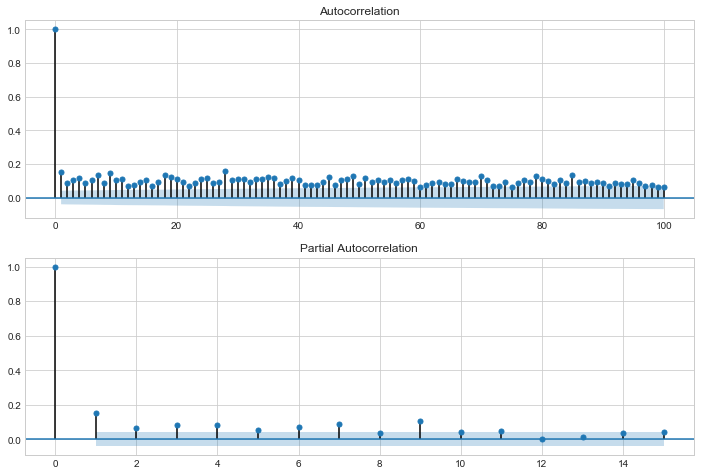

In [60]:
# ARIMA ACF, PACF graphs to help determine order of ARIMA model (statsmodel has these handy functions built-in)
 # all data

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(CarLot['Car_Count'], lags=100, ax=ax1)   # first value of diff is NaN
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(CarLot['Car_Count'], lags=15, ax=ax2)

ACF value for p is 0 and PACF value for q is 12.

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


                              ARMA Model Results                              
Dep. Variable:              Car_Count   No. Observations:                 2373
Model:                    ARMA(0, 12)   Log Likelihood              -12582.121
Method:                       css-mle   S.D. of innovations             48.580
Date:                Sun, 02 Dec 2018   AIC                          25192.241
Time:                        13:46:29   BIC                          25273.048
Sample:                    01-01-2010   HQIC                         25221.656
                         - 06-30-2016                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              112.7200      1.698     66.383      0.000     109.392     116.048
ma.L1.Car_Count      0.1107      0.021      5.394      0.000       0.070       0.151
ma.L2.Car_Count      0.0388 

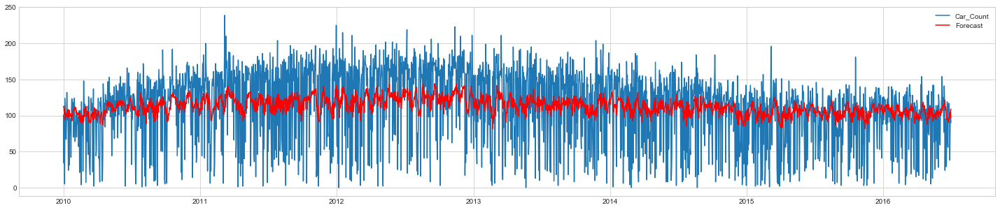

In [61]:
# fit ARIMA model - all data

float_CarCount = CarLot['Car_Count'].astype('float32')

fig = plt.figure(figsize=(25,5))
model = ARIMA(float_CarCount, order=(0,0,12)) 
ax = plt.gca()
results = model.fit() 
plt.plot(CarLot['Car_Count'])
plt.plot(results.fittedvalues, color='red')
ax.legend(['Car_Count', 'Forecast'])

print (results.summary())

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


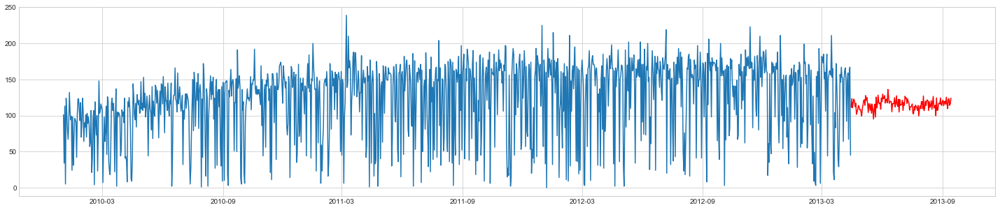

In [62]:
# Quick forecast - all data

fig = plt.figure(figsize=(25,5))
num_points = len(CarLot['Car_Count'])
x = results.predict(start=(1200), end=(1352), dynamic=False)

plt.plot(CarLot['Car_Count'][:1200])
plt.plot(x, color='r')

It seems to me that the forcasted values really do not fit the overall trend of all the years data & the variation isn't really included as well as it should. The above data includes both clear & cloudy days. Maybe two different prediction models are needed, one for clear days & a different one for cloudy, since combined together it's not really working.

# Clear Day Forecast

## Checking Stationarity - Clear Data

In [63]:
# Dickey-Fuller Stationarity Test 1 - clear data

from statsmodels.tsa.stattools import adfuller
def test_stationarity_clear1(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    #Plot rolling statistics:
    plt.figure(figsize=(25,5))
    ax = plt.gca()
    ax.set_xlabel('Clear Days Over the Years')
    ax.set_ylabel('Car_Count on Clear Days')
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test Clear Days:')
    dftest_clear = adfuller(timeseries, autolag='AIC')
    dfoutput_clear = pd.Series(dftest_clear[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest_clear[4].items():
        dfoutput_clear['Critical Value (%s)'%key] = value
    print(dfoutput_clear)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


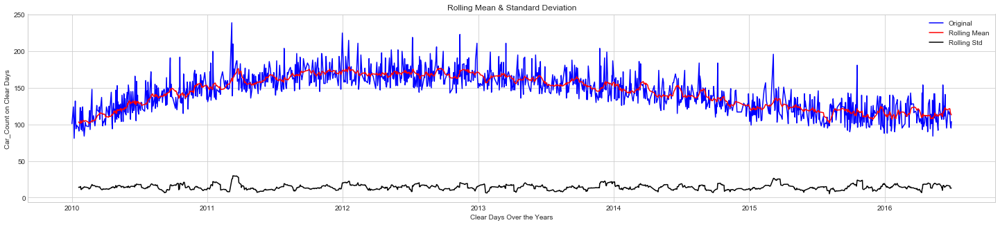

Results of Dickey-Fuller Test Clear Days:
Test Statistic                   -1.544676
p-value                           0.511307
#Lags Used                       20.000000
Number of Observations Used    1332.000000
Critical Value (1%)              -3.435269
Critical Value (5%)              -2.863712
Critical Value (10%)             -2.567927
dtype: float64


In [64]:
#cloudy = CarLot.loc[(CarLot['Cloud_Indicator'] == 'cloudy')]
clear = CarLot.loc[(CarLot['Cloud_Indicator'] == 'clear')]

test_stationarity_clear1(clear['Car_Count'])

Standard deviation was plotted instead of vairance to maintain similiar units to mean. 

The test statistic of -1.5 is greater than (>) the critical value(s). Thus we can **NOT** reject null hypothesis (H0), to say that the time series is non-stationary.  The rolling mean looks consistent w/ the clear data over the time series, while the rolling standard deviation is hovering around ~20 line. Neither of them seem to increase or decrease w/ time, but a wave in the data is noticable, maybe seasonable? 

In [65]:
# Dickey-Fuller Stationarity Test 2 - clear data

def test_stationarity_clear2(ts):
    stats = ['Test Statistic','p-value','Lags','Observations']
    df_test_clear = adfuller(ts, autolag='AIC')
    df_results_clear = pd.Series(df_test_clear[0:4], index=stats)
    for key,value in df_test_clear[4].items():
        df_results_clear['Critical Value (%s)'%key] = value
    print(df_results_clear)

In [66]:
test_stationarity_clear2(clear['Car_Count'])

Test Statistic            -1.544676
p-value                    0.511307
Lags                      20.000000
Observations            1332.000000
Critical Value (1%)       -3.435269
Critical Value (5%)       -2.863712
Critical Value (10%)      -2.567927
dtype: float64


## Make the Time Series Stationary - Clear Data


Two main reasons for a time series being non-stationary are:
 1. Trend - the mean varies over time (increases or decreases).
   * Estimating trend is typically done through transformations.
     * Log, exponential, square, square root, difference between, cummulative sum, etc. 
 2. Seasonality - variations at specific time-frames that tend to reoccur.
Once trend &/or seasonality can be modeled, it is then removed from the time series to help make it more stationary, at which time forecasting can be done. 

Multiple methods will be attemped on clear data for comparision purposes.

Since cloudy['Car_Count'] includes 0 values, a log transformation will not be able to be used for that data. 

In [67]:
clear['Car_Count'].describe()

count    1353.000000
mean      143.811530
std        26.038077
min        81.000000
25%       124.000000
50%       146.000000
75%       162.000000
max       239.000000
Name: Car_Count, dtype: float64

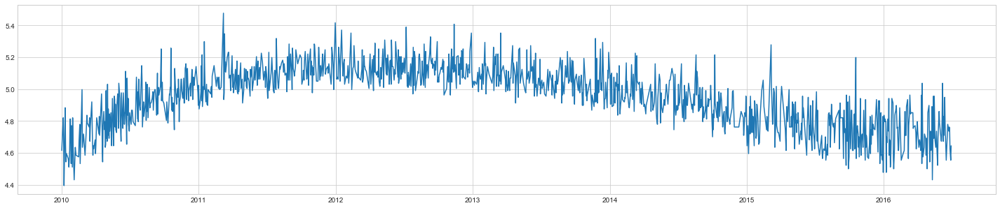

In [68]:
# Transformation w/ log - clear data

clear_log = np.log(clear['Car_Count'])
plt.figure(figsize=(25,5))
plt.plot(clear_log)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


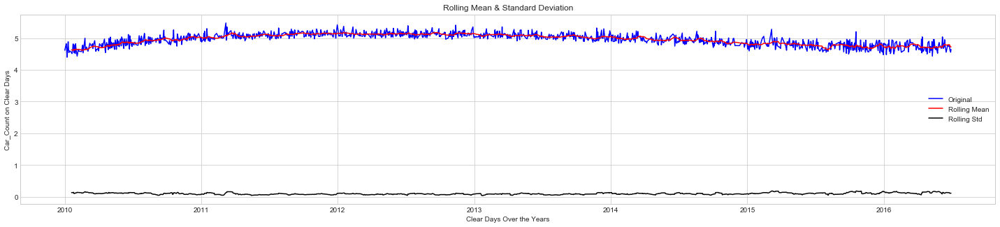

Results of Dickey-Fuller Test Clear Days:
Test Statistic                   -1.785136
p-value                           0.387866
#Lags Used                       23.000000
Number of Observations Used    1329.000000
Critical Value (1%)              -3.435280
Critical Value (5%)              -2.863717
Critical Value (10%)             -2.567929
dtype: float64


In [69]:
# Dickey-Fuller Stationarity Test 1 on log transform - clear data

test_stationarity_clear1(clear_log)

Test statistic is > (greater than) the critical value(s). The time series is still not stationary after a log transform of clear data.

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until


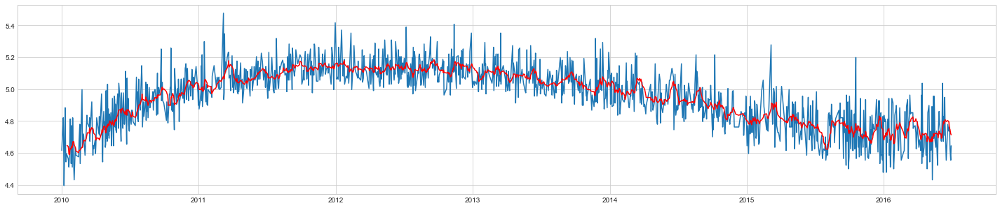

In [70]:
# Smoothing - Moving Average on log transform - clear data

moving_avg = pd.rolling_mean(clear_log, 10)
plt.figure(figsize=(25,5))
plt.plot(clear_log)
plt.plot(moving_avg, color = 'Red')

The rolling average takes an average of last 10 consecutive values (Red Line). Rolling mean is not defined for first 9 values. The rolling average needs to be subtracted from original time series to remove the trend.

In [71]:
# Moving Average - Subtract log transform moving avg trend from original log - clear data
 # clear data
    
clear_log_moving_avg_diff = clear_log - moving_avg
clear_log_moving_avg_diff.head(10)

date
2010-01-01        NaN
2010-01-03        NaN
2010-01-05        NaN
2010-01-06        NaN
2010-01-07        NaN
2010-01-10        NaN
2010-01-11        NaN
2010-01-12        NaN
2010-01-13        NaN
2010-01-15   -0.06121
Name: Car_Count, dtype: float64

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


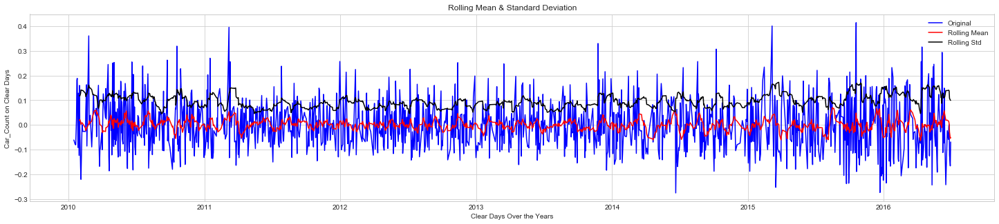

Results of Dickey-Fuller Test Clear Days:
Test Statistic                -1.445529e+01
p-value                        6.989804e-27
#Lags Used                     1.100000e+01
Number of Observations Used    1.332000e+03
Critical Value (1%)           -3.435269e+00
Critical Value (5%)           -2.863712e+00
Critical Value (10%)          -2.567927e+00
dtype: float64


In [72]:
# Moving Average - Drop NaN values & test stationarity again
 # Dickey-Fuller Stationarity Test 1 on log moving avg diff - clear data


clear_log_moving_avg_diff.dropna(inplace = True)
test_stationarity_clear1(clear_log_moving_avg_diff)

The test statistic of -14.5 is less than (<) the critical value(s). Thus we can reject null hypothesis (H0) to say that the time series is stationary with 99% confidence. The moving average looks somewhat consistent hovering around ~0 line over the time series, while the rolling standard deviation is also hovering ~0.1 line. Neither of them seem to increase or decrease w/ time.

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(halflife=10,min_periods=0,adjust=True,ignore_na=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until


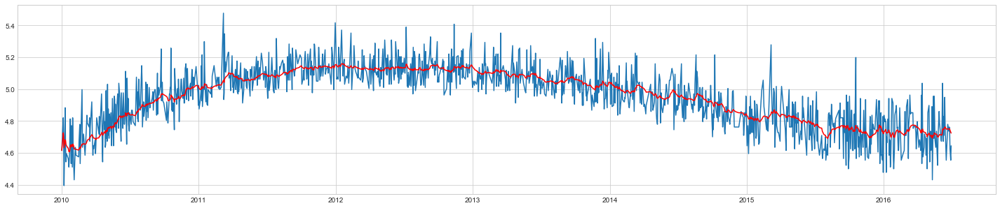

In [73]:
# Smoothing - Exponentially Weighted Moving Average on log transform - clear data

expwighted_avg = pd.ewma(clear_log, halflife=10)
plt.figure(figsize=(25,5))
plt.plot(clear_log)
plt.plot(expwighted_avg, color='red')

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


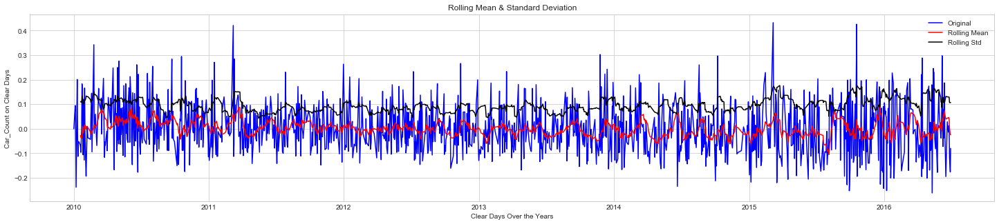

Results of Dickey-Fuller Test Clear Days:
Test Statistic                  -27.256759
p-value                           0.000000
#Lags Used                        1.000000
Number of Observations Used    1351.000000
Critical Value (1%)              -3.435200
Critical Value (5%)              -2.863682
Critical Value (10%)             -2.567910
dtype: float64


In [74]:
# Exponentially Weighted Moving Average - Subtract ewma trend from original log - clear data

clear_log_ewma_diff = clear_log - expwighted_avg
test_stationarity_clear1(clear_log_ewma_diff)

The test statistic of -27.3 is less than (<) the critical value(s). Thus we can reject null hypothesis (H0) to say that the time series is stationary with 99% confidence. The moving average looks somewhat cons|istent hovering around ~0 line over the time series, while the rolling standard deviation is also hovering ~0.1 line. Neither of them seem to increase or decrease w/ time.

## Removing Trend & Seasonality - Clear Data

The above processes above may not always work, especially w/ high seasonality. Two other options are:
 1. **Differencing** - taking the difference w/ a specific time lag.
 2. **Decomposition** - removing both of the trend & seasonality models from original.

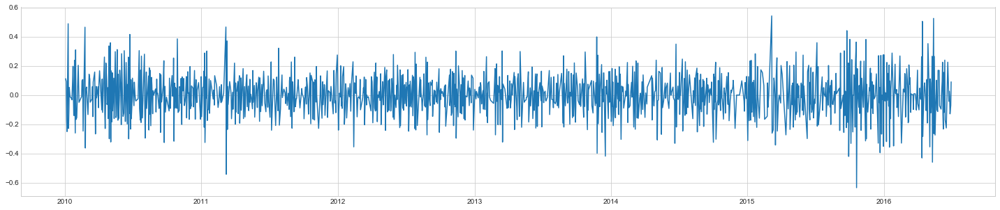

In [75]:
# Differencing by taking difference of log observation at a particular instant w/ that at the previous instant.
 # Clear Data

clear_log_diff = clear_log - clear_log.shift()
plt.figure(figsize=(25,5))
plt.plot(clear_log_diff)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


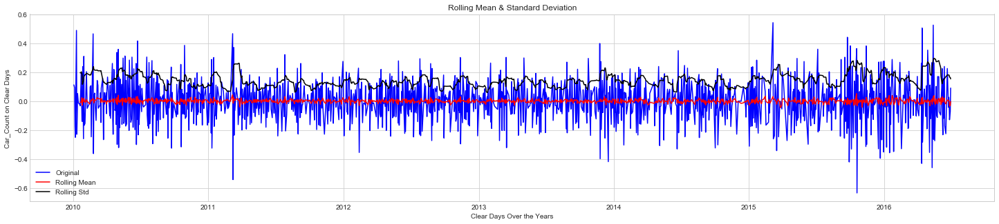

Results of Dickey-Fuller Test Clear Days:
Test Statistic                -1.088149e+01
p-value                        1.291418e-19
#Lags Used                     2.400000e+01
Number of Observations Used    1.327000e+03
Critical Value (1%)           -3.435287e+00
Critical Value (5%)           -2.863720e+00
Critical Value (10%)          -2.567931e+00
dtype: float64


In [76]:
# Differencing - Drop NaN values & test stationarity again
  # Dickey-Fuller Stationarity Test 1 on log diff - clear data

clear_log_diff.dropna(inplace= True)
test_stationarity_clear1(clear_log_diff)

The test statistic of -10.88 is less than (<) the critical value(s). Thus we can reject null hypothesis (H0) to say that the time series is stationary with 99% confidence. The moving average looks somewhat cons|istent hovering around ~0 line over the time series, while the rolling standard deviation is also hovering just under ~0.2 line. Neither of them seem to increase or decrease w/ time. For better results, could try taking 2nd & 3rd level differences.

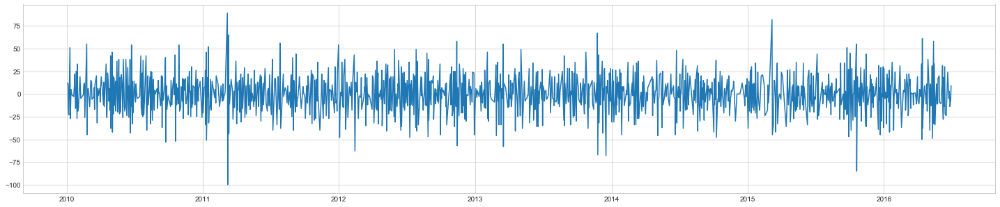

In [77]:
# Differencing by taking difference of clear original observation at a particular instant w/ that at the previous instant.
 # Clear Data

clear_diff = clear['Car_Count'] - clear['Car_Count'].shift(1)
plt.figure(figsize=(25,5))
plt.plot(clear_diff)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


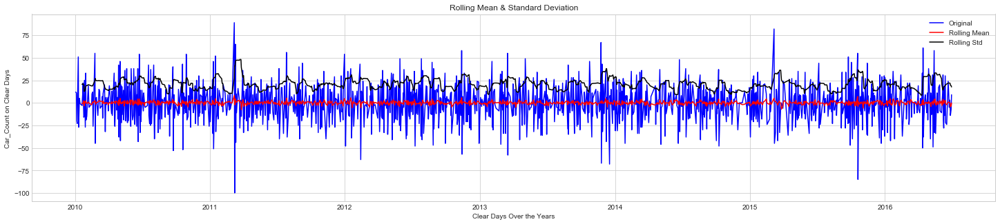

Results of Dickey-Fuller Test Clear Days:
Test Statistic                -1.090358e+01
p-value                        1.142956e-19
#Lags Used                     2.400000e+01
Number of Observations Used    1.327000e+03
Critical Value (1%)           -3.435287e+00
Critical Value (5%)           -2.863720e+00
Critical Value (10%)          -2.567931e+00
dtype: float64


In [78]:
# Differencing - Drop NaN values & test stationarity again
  # Dickey-Fuller Stationarity Test 1 on org diff - clear data
    
clear_diff.dropna(inplace= True)
test_stationarity_clear1(clear_diff)

The test statistic of -10.91 is less than (<) the critical value(s). Thus we can reject null hypothesis (H0) to say that the time series is stationary with 99% confidence. The moving average looks somewhat consistent hovering around ~0 line over the time series, while the rolling standard deviation is also hovering ~0.15 line. Neither of them seem to increase or decrease w/ time. For better results, could try taking 2nd & 3rd level differences.

Displays there is a trend but no seasonality within the clear data. Stationarity test won't work due to constant/no residuals.

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


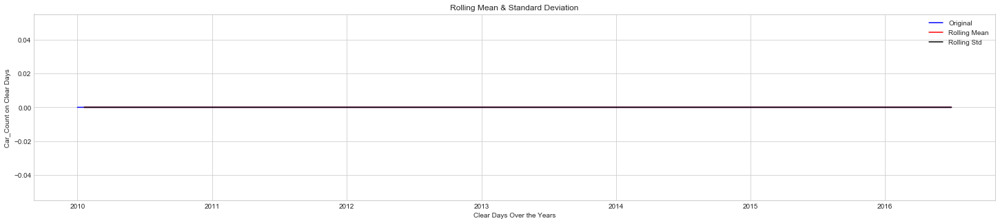

Results of Dickey-Fuller Test Clear Days:
Test Statistic                         NaN
p-value                                NaN
#Lags Used                        0.000000
Number of Observations Used    1352.000000
Critical Value (1%)              -3.435196
Critical Value (5%)              -2.863680
Critical Value (10%)             -2.567909
dtype: float64


C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:660: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\base\model.py:1036: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
C:\Users\Samantha\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\Samantha\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\Samantha\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


In [82]:
# Decomposing - Drop NaN values & test stationarity again
  # Dickey-Fuller Stationarity Test 1 on log decomp - clear data
    
clear_log_decompose = residual
clear_log_decompose.dropna(inplace= True)
test_stationarity_clear1(clear_log_decompose)

# Forecasting Time Series w/ ARIMA - Clear Data

We will continue to work with both the clear differencing data & the clear log differencing data to compare.

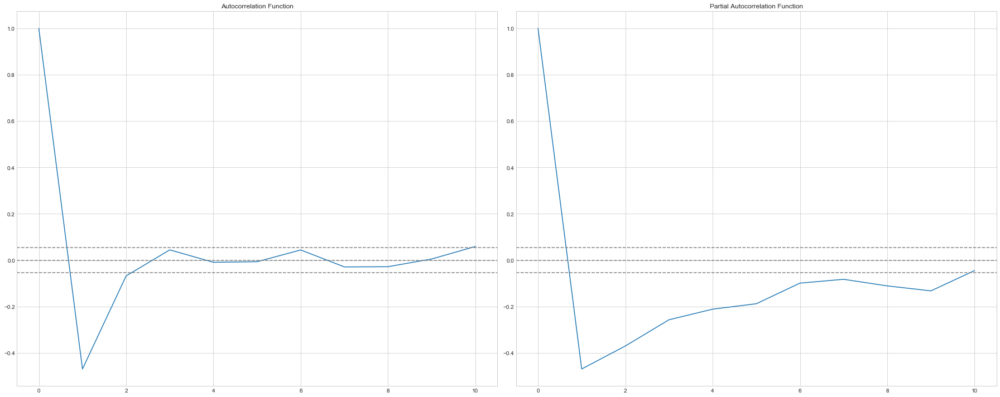

In [85]:
# ARIMA ACF and PACF plots using Log Differencing - clear data:

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf  

lag_acf_logclear = acf(clear_log_diff, nlags=10)
lag_pacf_logclear = pacf(clear_log_diff, nlags=10, method='ols')
plt.figure(figsize=(25,10))


# Plot ACF:    
plt.subplot(121)
plt.plot(lag_acf_logclear)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(clear_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(clear_log_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf_logclear)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(clear_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(clear_log_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

For clear data log differencing- Where the PACF & ACF crosses the upper confidence interval (top dashed line) are the values needed for p & q, respectively. The value of p, lag value of **ACF (p) is 1**, since the ACF line never crosses the upper confidence limit. The value of q, lag value of **PACF (q) is 0** because of a geometeric decay. (p,d,q) therefore (1,1,0)

Text(0.5,1,'Partial Autocorrelation Function')

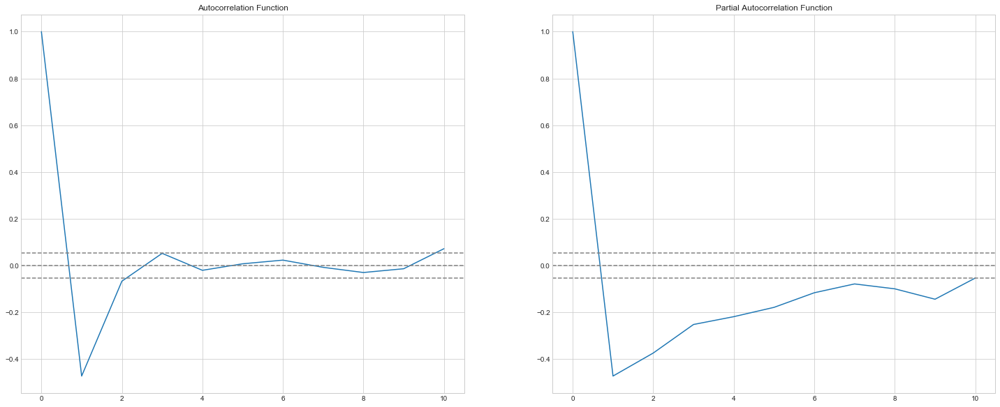

In [86]:
# ARIMIA ACF and PACF plots using Differencing only - Clear data:

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf  

lag_acf_clear = acf(clear_diff, nlags=10)
lag_pacf_clear = pacf(clear_diff, nlags=10, method='ols')
plt.figure(figsize=(25,10))


# Plot ACF:    
plt.subplot(121)
plt.plot(lag_acf_clear)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(clear_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(clear_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf_clear)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(clear_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(clear_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')

For clear data differencing only- Where the PACF & ACF crosses the upper confidence interval (top dashed line) are the values needed for p & q, respectively. The value of p, lag value of **ACF (p) is 1**, since the ACF line never crosses the upper confidence limit. The value of q, lag value of **PACF (q) is 0** because of a geometeric decay. (p,d,q) therefore (1,1,0)

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 22.1841')

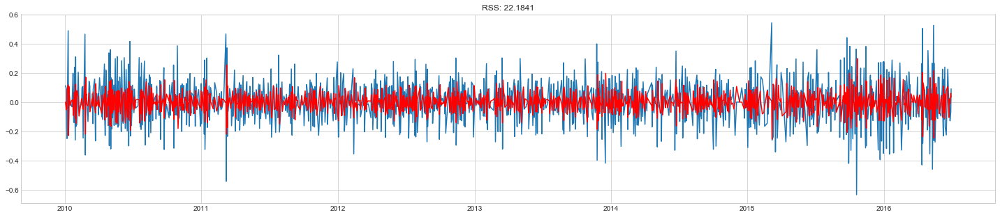

In [87]:
# AR Model (p=1) Log Diff - clear data

model_clearlog = ARIMA(clear_log, order=(1, 1, 0))  
results_AR_clearlog = model_clearlog.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_log_diff)
plt.plot(results_AR_clearlog.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR_clearlog.fittedvalues-clear_log_diff)**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 455992.4432')

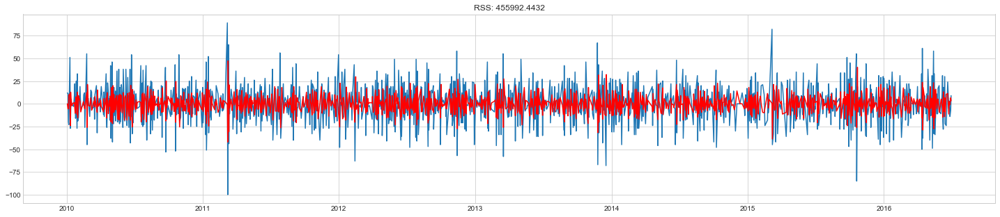

In [88]:
# AR Model (p=1) Diff Only - clear data

float_clearCC = clear['Car_Count'].astype('float32')

model_cleardiff = ARIMA(float_clearCC, order=(1, 1, 0))  
results_AR_cleardiff = model_cleardiff.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_diff)
plt.plot(results_AR_cleardiff.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR_cleardiff.fittedvalues-clear_diff)**2))

Text(0.5,1,'RSS: 28.4618')

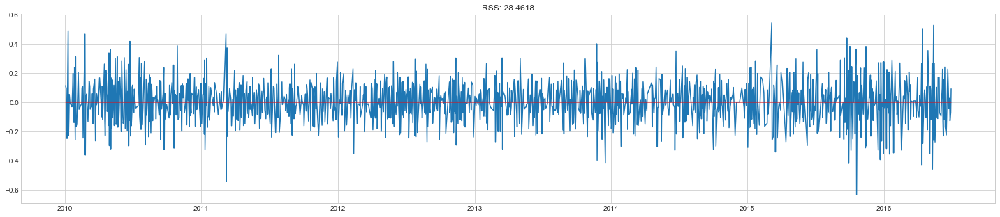

In [94]:
# MA Model (q=0) log Diff - clear data

model_clearlog = ARIMA(clear_log, order=(0, 1, 0))  
results_MA_clearlog = model_clearlog.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_log_diff)
plt.plot(results_MA_clearlog.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_clearlog.fittedvalues-clear_log_diff)**2))

Text(0.5,1,'RSS: 587254.9999')

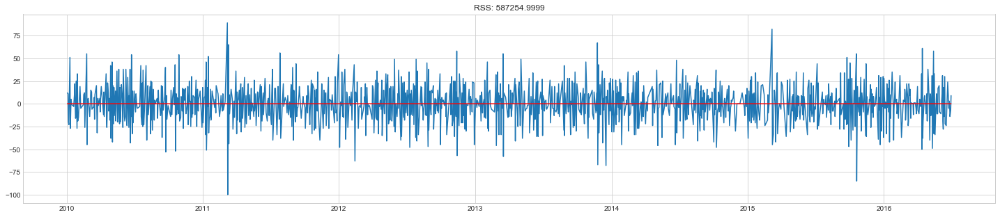

In [95]:
# MA Model (q=0) Diff only - clear data

float_clearCC = clear['Car_Count'].astype('float32')

model_cleardiff = ARIMA(float_clearCC, order=(0, 1, 0))  
results_MA_diff = model_cleardiff.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_diff)
plt.plot(results_MA_cleardiff.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_cleardiff.fittedvalues-clear_diff)**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 15.3424')

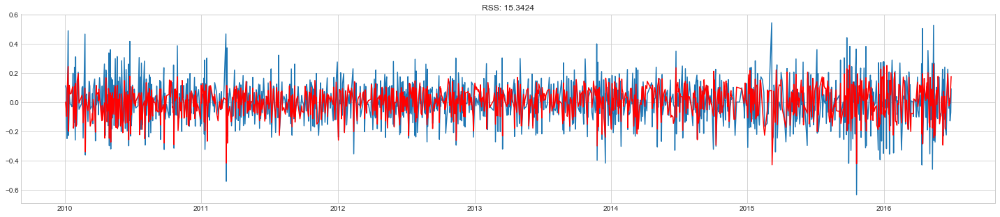

In [96]:
# Combined ARIMA Model (p,d,q) = (1,1,0) log Diff - clear data

model_clearlog = ARIMA(clear_log, order=(1, 1, 1))  
results_ARIMA_clearlog = model_clearlog.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_log_diff)
plt.plot(results_ARIMA_clearlog.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA_clearlog.fittedvalues-clear_log_diff)**2))


C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 455992.4432')

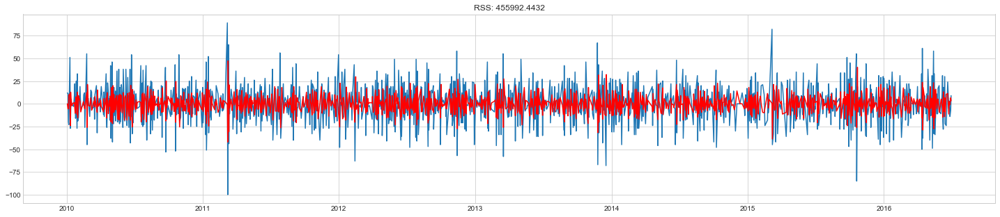

In [98]:
# Combined ARIMA Model (p,d,q) = (1,1,0) Diff Only - clear data

float_clearCC = clear['Car_Count'].astype('float32')

model_cleardiff = ARIMA(float_clearCC, order=(1, 1, 0))  
results_ARIMA_cleardiff = model_cleardiff.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(clear_diff)
plt.plot(results_ARIMA_cleardiff.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA_cleardiff.fittedvalues-clear_diff)**2))


Going forward, we will only use differencing on the clear data to model fit and forecast as it was stationary and is easy to reconvert back to original clear data. 

### Convert back to original scale

In [99]:
# Converting back to original for Differencing Only - clear data

predictions_ARIMA_cleardiff = pd.Series(results_ARIMA_cleardiff.fittedvalues, copy=True)
print(predictions_ARIMA_cleardiff.head())

date
2010-01-03    -0.002768
2010-01-05    -5.675000
2010-01-06    -5.202423
2010-01-07     9.447463
2010-01-10    10.865194
dtype: float64


In [100]:
#clear_diff = clear['Car_Count'] - clear['Car_Count'].shift(1)

#clear_diff + clear['Car_Count'].shift(1) = clear['Car_Count'] 

predictions_ARIMA_ORG_clear = predictions_ARIMA_cleardiff + clear['Car_Count'].shift(1)
print(predictions_ARIMA_ORG_clear.head())

date
2010-01-01           NaN
2010-01-03    100.997232
2010-01-05    107.325000
2010-01-06    118.797577
2010-01-07    113.447463
dtype: float64


In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time
    
#print(predictions_ARIMA_ORG.iloc[0])

In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time
    
#predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
#print(predictions_ARIMA_diff.head())

In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time

#predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
#print(predictions_ARIMA_diff_cumsum.head())

In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time
    
#predictions_ARIMA_log = pd.Series(clear_log.iloc[0], index=clear_log.index)
#predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
#predictions_ARIMA_log.head()

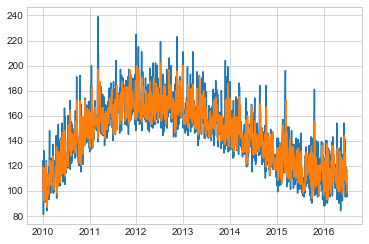

In [101]:
# DIFF ONLY

plt.plot(float_clearCC)
plt.plot(predictions_ARIMA_ORG_clear)

In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time
    
#plt.plot(clear_log)
#plt.plot(predictions_ARIMA_log)

Text(0.5,1,'RMSE: nan')

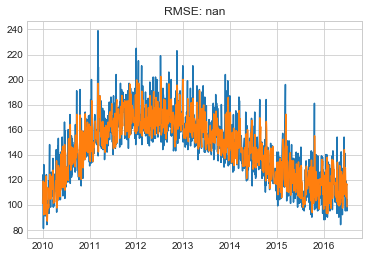

In [103]:
# DIFF ONLY - clear data

plt.plot(float_clearCC)
plt.plot(predictions_ARIMA_ORG_clear)
plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA_ORG_clear-clear['Car_Count'])**2)/len(clear['Car_Count'])))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


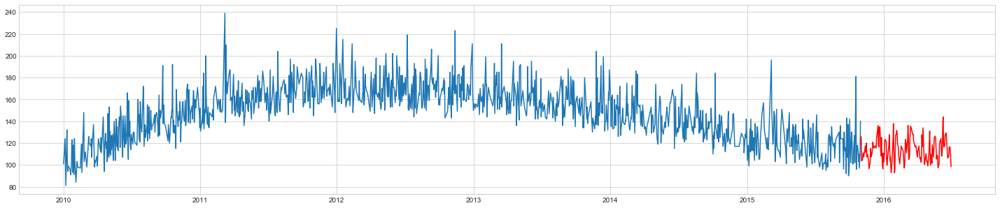

In [104]:
# Quick forecast - clear data

fig = plt.figure(figsize=(25, 5))
num_points = len(clear['Car_Count'])
x_clear = results_ARIMA_cleardiff.predict(start=(1200), end=(1352), dynamic=False)
x_ORG_clear = x_clear + clear['Car_Count'].shift(1)

plt.plot(clear['Car_Count'][:1200])
plt.plot(x_ORG_clear, color='red')

This forecast looks to have great fit!! *Happy*

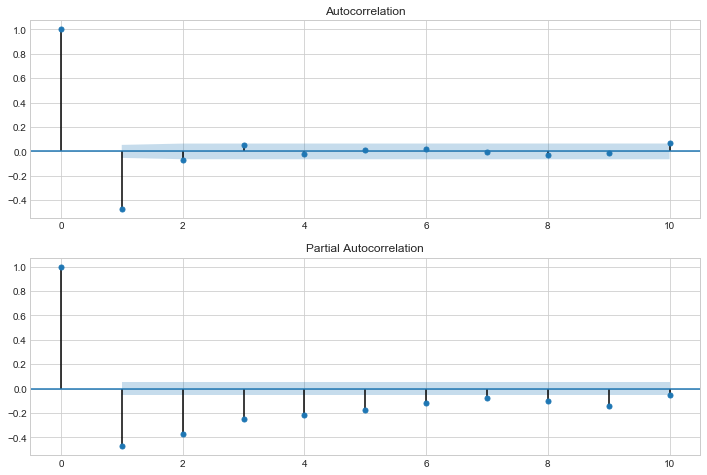

In [105]:
# ARIMA ACF, PACF graphs to help determine order of ARIMA model (statsmodel has these handy functions built-in)
 # clear data

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(clear_diff[1:], lags=10, ax=ax1)   # first value of diff is NaN
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(clear_diff[1:], lags=10, ax=ax2)

In [ ]:
# The Following code doesn't look right
  # Will need to investigate further at another time
    
#predictions_ARIMA = np.exp(predictions_ARIMA_log)
#plt.plot(clear['Car_Count'])
#plt.plot(predictions_ARIMA)
#plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA-clear['Car_Count'])**2)/len(clear['Car_Count'])))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


                              ARMA Model Results                              
Dep. Variable:              Car_Count   No. Observations:                 1353
Model:                     ARMA(1, 0)   Log Likelihood               -5911.542
Method:                       css-mle   S.D. of innovations             19.107
Date:                Sun, 02 Dec 2018   AIC                          11829.084
Time:                        15:06:30   BIC                          11844.714
Sample:                    01-01-2010   HQIC                         11834.936
                         - 06-29-2016                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             143.6822      1.620     88.696      0.000     140.507     146.857
ar.L1.Car_Count     0.6798      0.020     34.036      0.000       0.641       0.719
                                

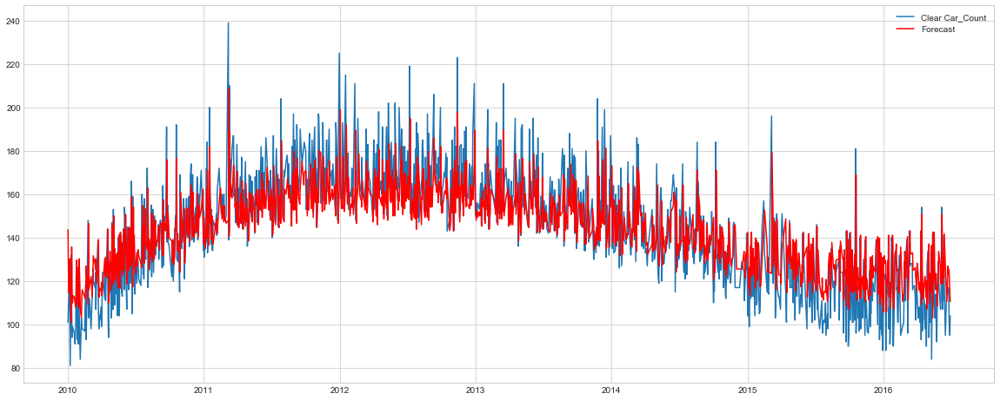

In [107]:
# fit ARIMA model - clear data

float_clearCC = clear['Car_Count'].astype('float32')

fig = plt.figure(figsize=(25,5))
model_clear = ARIMA(float_clearCC, order=(1,0,0)) 
ax = plt.gca()
results_clear = model_clear.fit() 
plt.plot(clear['Car_Count'])
plt.plot(results_clear.fittedvalues, color='red')
ax.legend(['Clear Car_Count', 'Forecast'])

print (results_clear.summary())

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


                             ARIMA Model Results                              
Dep. Variable:            D.Car_Count   No. Observations:                 1352
Model:                 ARIMA(1, 1, 0)   Log Likelihood               -5853.406
Method:                       css-mle   S.D. of innovations             18.364
Date:                Sun, 02 Dec 2018   AIC                          11712.812
Time:                        15:09:34   BIC                          11728.440
Sample:                    01-03-2010   HQIC                         11718.664
                         - 06-29-2016                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0028      0.339     -0.008      0.993      -0.668       0.662
ar.L1.D.Car_Count    -0.4726      0.024    -19.728      0.000      -0.520      -0.426
                        

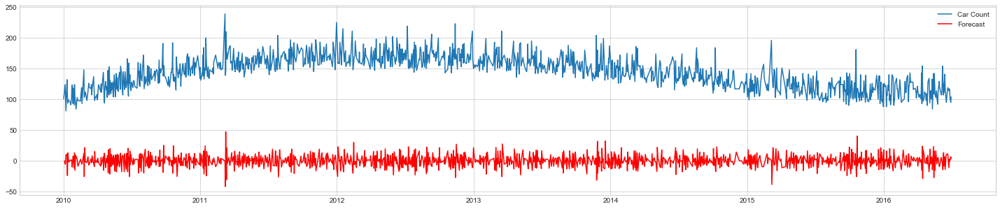

In [112]:
# fit ARIMA model

float_clearCC = clear['Car_Count'].astype('float32')

fig = plt.figure(figsize=(25,5))
model_clear2 = ARIMA(float_clearCC, order=(1,1,0)) 
ax = plt.gca()
results_clear2 = model_clear2.fit() 
plt.plot(clear['Car_Count'])
plt.plot(results_clear2.fittedvalues, color='red')
ax.legend(['Car Count', 'Forecast'])

print (results_clear2.summary())

# Cloudy Day Forecast

## Checking Stationarity - Cloudy Days

In [113]:
# Dickey-Fuller Stationarity Test 1 - cloudy data

from statsmodels.tsa.stattools import adfuller
def test_stationarity_cloudy1(timeseries):
    
    # Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    # Plot rolling statistics:
    plt.figure(figsize=(25,5))
    ax = plt.gca()
    ax.set_xlabel('Cloudy Days Over the Years')
    ax.set_ylabel('Car_Count on Cloudy Days')
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test Cloudy Days:')
    dftest_cloudy = adfuller(timeseries, autolag='AIC')
    dfoutput_cloudy = pd.Series(dftest_cloudy[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest_cloudy[4].items():
        dfoutput_cloudy['Critical Value (%s)'%key] = value
    print(dfoutput_cloudy)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


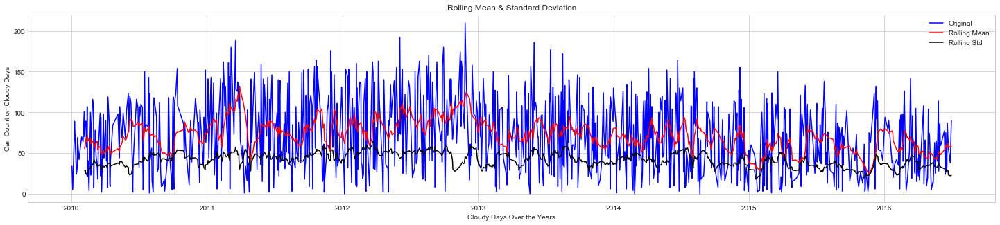

Results of Dickey-Fuller Test Cloudy Days:
Test Statistic                -1.097687e+01
p-value                        7.630744e-20
#Lags Used                     4.000000e+00
Number of Observations Used    1.015000e+03
Critical Value (1%)           -3.436809e+00
Critical Value (5%)           -2.864392e+00
Critical Value (10%)          -2.568288e+00
dtype: float64


In [114]:
cloudy = CarLot.loc[(CarLot['Cloud_Indicator'] == 'cloudy')]
#clear = CarLot.loc[(CarLot['Cloud_Indicator'] == 'clear')]

test_stationarity_cloudy1(cloudy['Car_Count'])

Standard deviation was plotted instead of vairance to maintain similiar units to mean.

The test statistic of -10.98 is less than (<) the critical value(s). Thus we can reject null hypothesis (H0), to say that the time series is stationary w/ 99% confidence. The rolling mean looks consistent w/ the cloudy data over the time series, while the rolling standard deviation is hovering around ~35 line. Neither of them seem to increase or decrease w/ time, but a very slight wave in the data is noticable, maybe seasonable?

In [115]:
# Dickey-Fuller Stationarity Test 2 - cloudy data

def test_stationarity_cloudy2(ts):
    stats = ['Test Statistic','p-value','Lags','Observations']
    df_test_cloudy = adfuller(ts, autolag='AIC')
    df_results_cloudy = pd.Series(df_test_cloudy[0:4], index=stats)
    for key,value in df_test_cloudy[4].items():
        df_results_cloudy['Critical Value (%s)'%key] = value
    print(df_results_cloudy)

In [116]:
test_stationarity_cloudy2(cloudy['Car_Count'])

Test Statistic         -1.097687e+01
p-value                 7.630744e-20
Lags                    4.000000e+00
Observations            1.015000e+03
Critical Value (1%)    -3.436809e+00
Critical Value (5%)    -2.864392e+00
Critical Value (10%)   -2.568288e+00
dtype: float64


# Forecasting Time Series w/ ARIMA - Cloudy Days

Text(0.5,1,'Partial Autocorrelation Function')

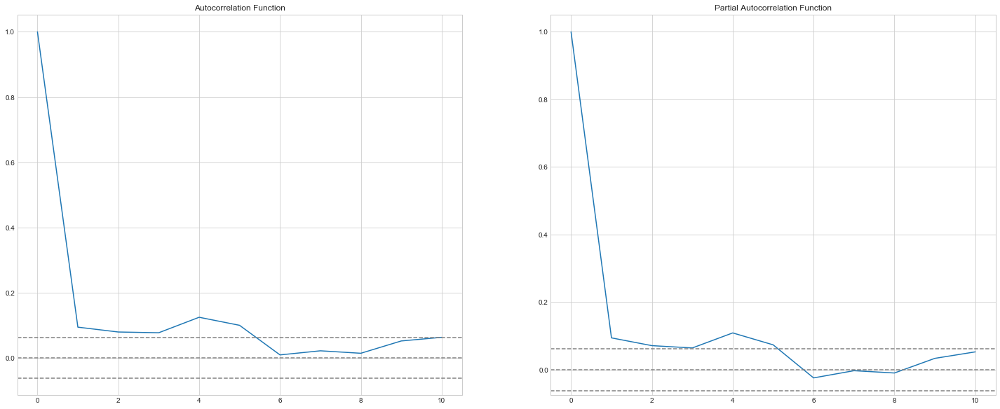

In [117]:
# ARIMA ACF and PACF plots - cloudy data:

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf  

lag_acf_cloudy = acf(cloudy['Car_Count'], nlags=10)
lag_pacf_cloudy = pacf(cloudy['Car_Count'], nlags=10, method='ols')
plt.figure(figsize=(25,10))


#Plot ACF:    
ax.set_ylim(-0.2, 0.2)
plt.subplot(121)
plt.plot(lag_acf_cloudy)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(cloudy['Car_Count'])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(cloudy['Car_Count'])),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
ax.set_ylim(-0.2, 0.2)
plt.subplot(122)
plt.plot(lag_pacf_cloudy)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(cloudy['Car_Count'])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(cloudy['Car_Count'])),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')

Where the PACF & ACF crosses the upper confidence interval (top dashed line) are the values needed for *p* & *q*, respectively. The value of *p*, lag value of **PACF is 5 or 6**, where the PACF line never crosses the upper confidence limit. The value of *q*, lag value of **ACF is 5 or 6** which is the first point the ACF line crosses the upper confidence limit. (p,d,q) therefore (5-6,0,5-6)

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 1941141.5394')

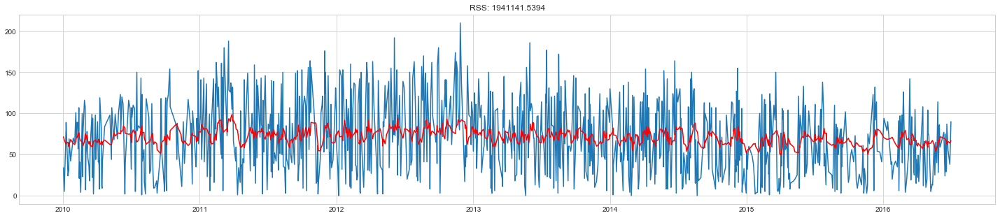

In [118]:
# AR Model (p=5) - cloudy data

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy = ARIMA(float_cloudyCC, order=(5, 0, 0))  
results_AR_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy['Car_Count'])
plt.plot(results_AR_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR_cloudy.fittedvalues-cloudy['Car_Count'])**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 1940010.0055')

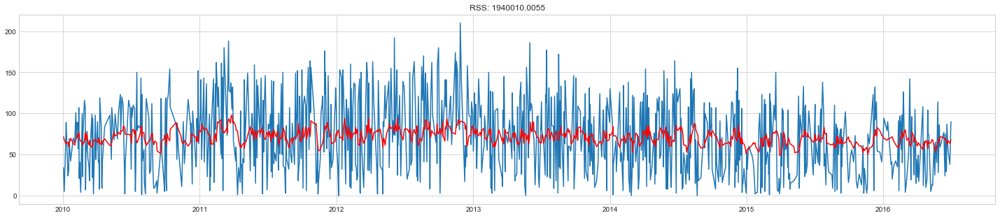

In [119]:
# AR Model (p=6) - cloudy data

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy2 = ARIMA(float_cloudyCC, order=(6, 0, 0))  
results_AR_cloudy2 = model_cloudy2.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy['Car_Count'])
plt.plot(results_AR_cloudy2.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR_cloudy2.fittedvalues-cloudy['Car_Count'])**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 1941266.7997')

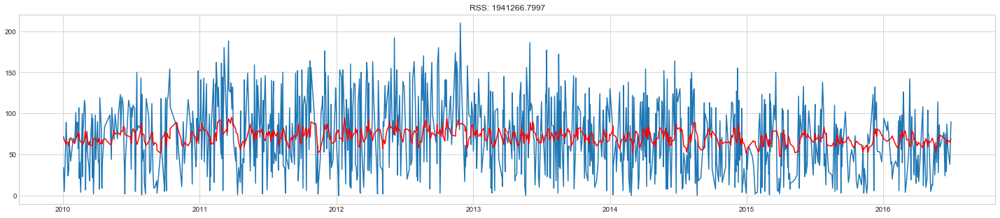

In [121]:
# MA Model (q=5) - cloudy data

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy = ARIMA(float_cloudyCC, order=(0, 0, 5))  
results_MA_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy['Car_Count'])
plt.plot(results_MA_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_cloudy.fittedvalues-cloudy['Car_Count'])**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 1940899.8094')

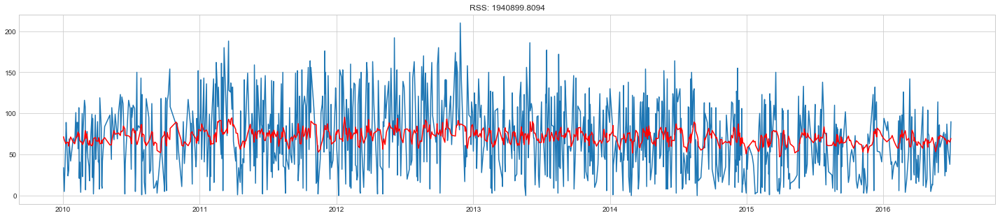

In [122]:
# MA Model (q=6) - cloudy data

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy2 = ARIMA(float_cloudyCC, order=(0, 0, 6))  
results_MA_cloudy2 = model_cloudy2.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy['Car_Count'])
plt.plot(results_MA_cloudy2.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_cloudy2.fittedvalues-cloudy['Car_Count'])**2))

The RSS value is lower for p & q both to be 6, so I'll go forward with that one for ARIMA prediction model. (6,0,6)

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\base\model.py:473: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\base\model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

Text(0.5,1,'RSS: 1891235.9979')

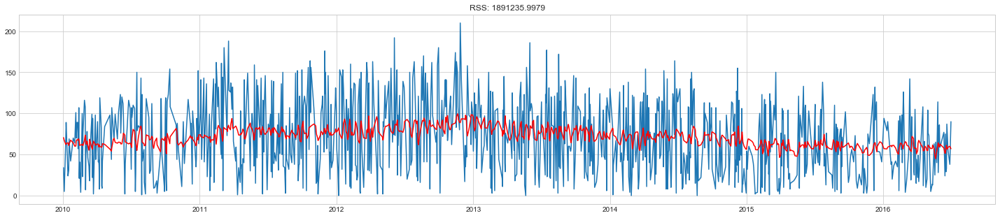

In [123]:
# Combined ARIMA Model (p,d,q) = (6,0,6)

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy = ARIMA(float_cloudyCC, order=(6, 0, 6))  
results_ARIMA_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy['Car_Count'])
plt.plot(results_ARIMA_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA_cloudy.fittedvalues-cloudy['Car_Count'])**2))


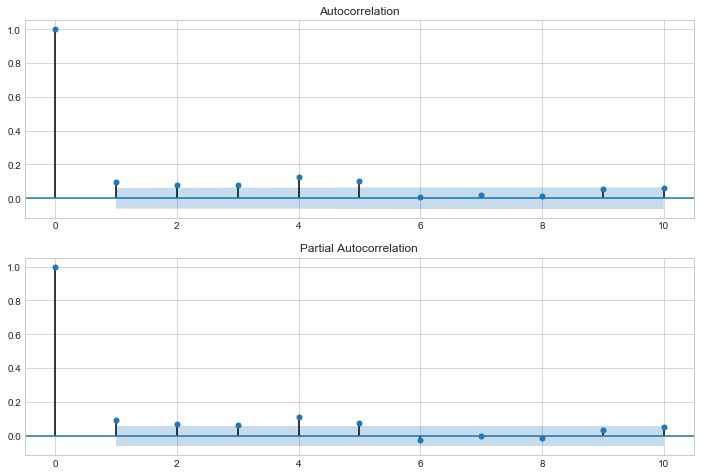

In [126]:
# ACF, PACF graphs to help determine order of ARIMA model, again statsmodel has these handy functions built-in

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(cloudy['Car_Count'], lags=10, ax=ax1)   # first value of diff is NaN
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(cloudy['Car_Count'], lags=10, ax=ax2)

The above plot also confirms that p & q were 6.

Now I'm curious to see if differencing for the cloudy values would make a better forecast or not.

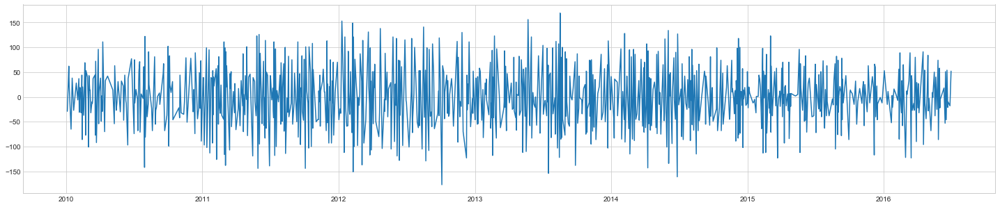

In [127]:
# Differencing for Cloudy

cloudy_diff = cloudy['Car_Count'] - cloudy['Car_Count'].shift(1)
plt.figure(figsize=(25,5))
plt.plot(cloudy_diff)

C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()
  import sys
C:\Users\Samantha\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()
  


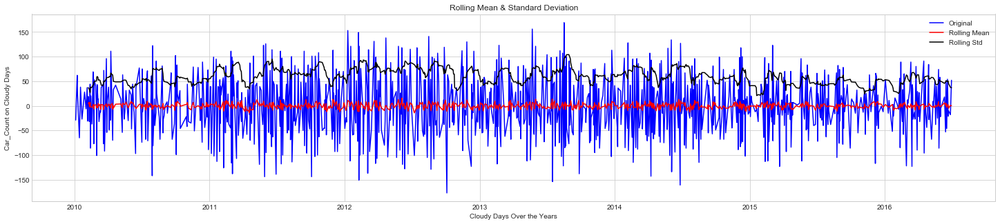

Results of Dickey-Fuller Test Cloudy Days:
Test Statistic                -1.268342e+01
p-value                        1.173544e-23
#Lags Used                     2.100000e+01
Number of Observations Used    9.970000e+02
Critical Value (1%)           -3.436926e+00
Critical Value (5%)           -2.864443e+00
Critical Value (10%)          -2.568316e+00
dtype: float64


In [128]:
cloudy_diff.dropna(inplace= True)
test_stationarity_cloudy1(cloudy_diff)

Text(0.5,1,'Partial Autocorrelation Function')

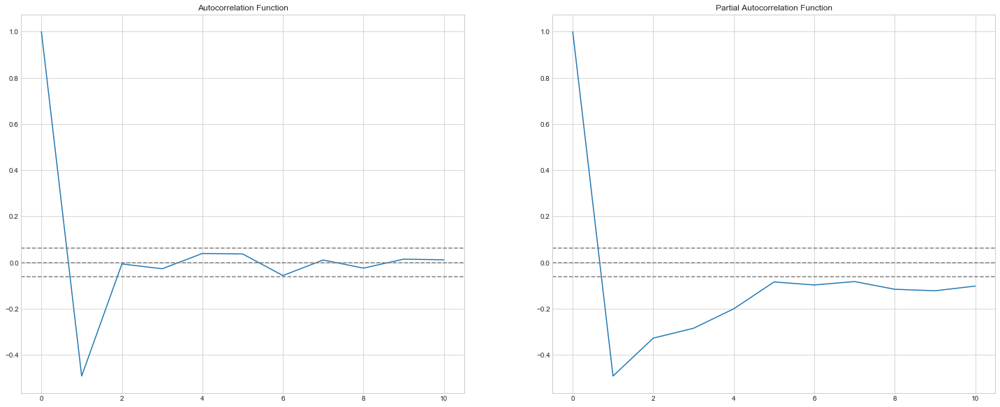

In [129]:
# ARIMA ACF and PACF plots w/ Diff Only for Cloudy:

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf  

lag_acf_cloudy = acf(cloudy_diff, nlags=10)
lag_pacf_cloudy = pacf(cloudy_diff, nlags=10, method='ols')
plt.figure(figsize=(25,10))


#Plot ACF:    
plt.subplot(121)
plt.plot(lag_acf_cloudy)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(cloudy_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(cloudy_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf_cloudy)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(cloudy_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(cloudy_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')

Again p looks to be 1 and q looks to be 0 due to geometric decay.

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 2759349.6224')

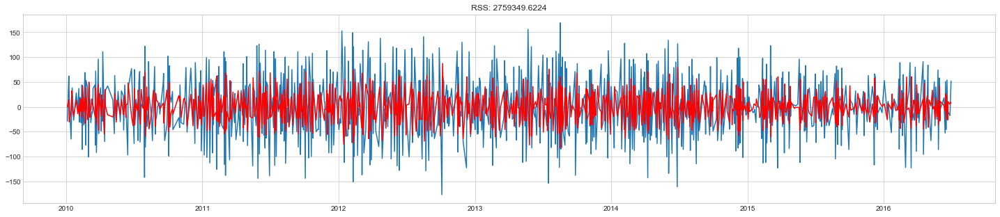

In [130]:
# AR Model (p=1) Diff Only for CLoudy

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy = ARIMA(float_cloudyCC, order=(1, 1, 0))  
results_AR_diff_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy_diff)
plt.plot(results_AR_diff_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR_diff_cloudy.fittedvalues-cloudy_diff)**2))

Taking the first difference seems to better account for the variablity w/in the data values.

Text(0.5,1,'RSS: 3641834.9359')

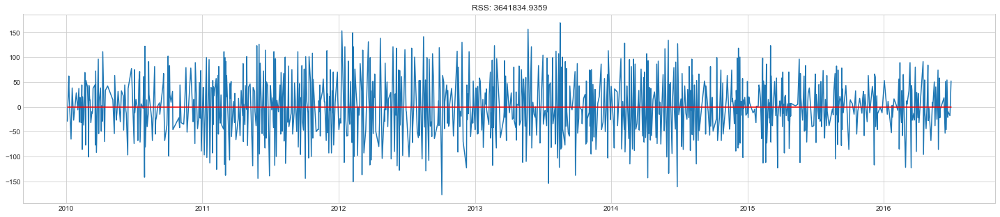

In [131]:
# MA Model (q=0) Diff only for Cloudy

float_cloudyCC = cloudy['Car_Count'].astype('float32')


model_cloudy = ARIMA(float_cloudyCC, order=(0, 1, 0))  
results_MA_diff_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy_diff)
plt.plot(results_MA_diff_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_diff_cloudy.fittedvalues-cloudy_diff)**2))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 1926981.9407')

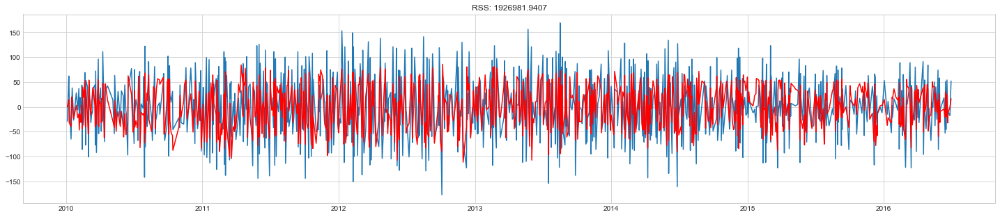

In [132]:
# MA Model (q=1) Diff only for cloudy   *just to check*

float_cloudyCC = cloudy['Car_Count'].astype('float32')


model_cloudy = ARIMA(float_cloudyCC, order=(0, 1, 1))  
results_MA_diff_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy_diff)
plt.plot(results_MA_diff_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_MA_diff_cloudy.fittedvalues-cloudy_diff)**2))

MA model loooks to  have a better RSS when the value of q = 1 than when q=0.

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


Text(0.5,1,'RSS: 2759349.6224')

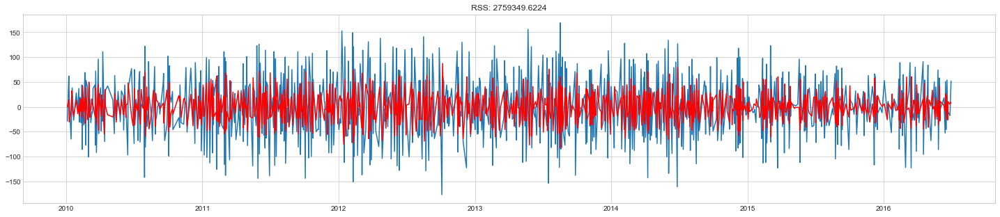

In [136]:
# Combined ARIMA Model (p,d,q) = (1,1,0) Diff Only for cloudy

float_cloudyCC = cloudy['Car_Count'].astype('float32')

model_cloudy = ARIMA(float_cloudyCC, order=(1, 1, 0))  
results_ARIMA_diff_cloudy = model_cloudy.fit(disp=-1)  
plt.figure(figsize=(25,5))
plt.plot(cloudy_diff)
plt.plot(results_ARIMA_diff_cloudy.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA_diff_cloudy.fittedvalues-cloudy_diff)**2))


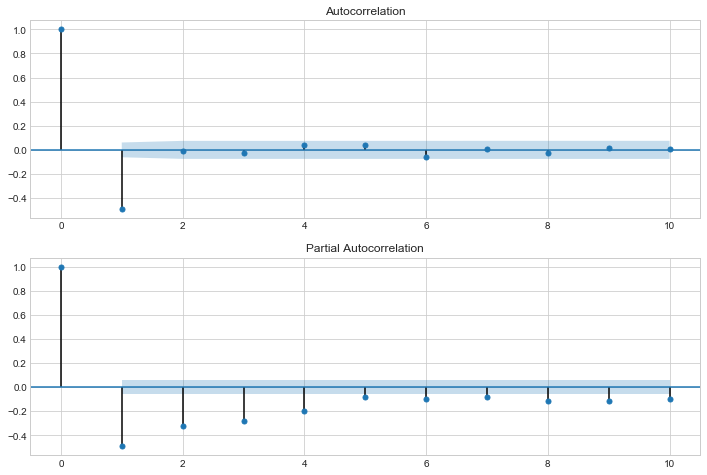

In [135]:
# ACF, PACF graphs to help determine order of ARIMA model (statsmodel has these handy functions built-in)

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(cloudy_diff[1:], lags=10, ax=ax1)   # first value of diff is NaN
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(cloudy_diff[1:], lags=10, ax=ax2)

### Convert back to original scale

In [137]:
# Diff Only for cloudy
predictions_ARIMA_diff_cloudy = pd.Series(results_ARIMA_diff_cloudy.fittedvalues, copy= True)
print(predictions_ARIMA_diff_cloudy.head())

date
2010-01-04     0.047527
2010-01-08    14.341016
2010-01-09   -30.437582
2010-01-14   -10.754682
2010-01-16    32.055627
dtype: float64


In [138]:
#clear_diff = clear['Car_Count'] - clear['Car_Count'].shift(1)

#clear_diff + clear['Car_Count'].shift(1) = clear['Car_Count'] 

predictions_ARIMA_ORG_cloudy = predictions_ARIMA_diff_cloudy + cloudy['Car_Count'].shift(1)
print(predictions_ARIMA_ORG_cloudy.head())

date
2010-01-02          NaN
2010-01-04    34.047527
2010-01-08    19.341016
2010-01-09    36.562418
2010-01-14    78.245318
dtype: float64


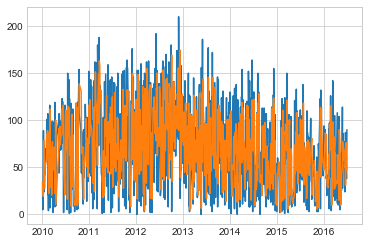

In [140]:
# DIFF ONLY for cloudy

plt.plot(float_cloudyCC)
plt.plot(predictions_ARIMA_ORG_cloudy)

Text(0.5,1,'RMSE: nan')

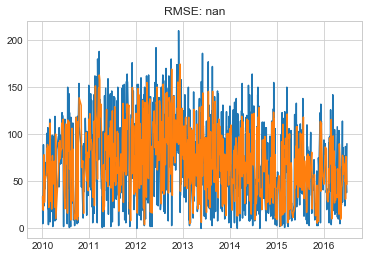

In [141]:
# DIFF ONLY

#predictions_ARIMA = np.exp(predictions_ARIMA_log)
plt.plot(float_cloudyCC)
plt.plot(predictions_ARIMA_ORG_cloudy)
plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA_ORG_cloudy-cloudy['Car_Count'])**2)/len(cloudy['Car_Count'])))

C:\Users\Samantha\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


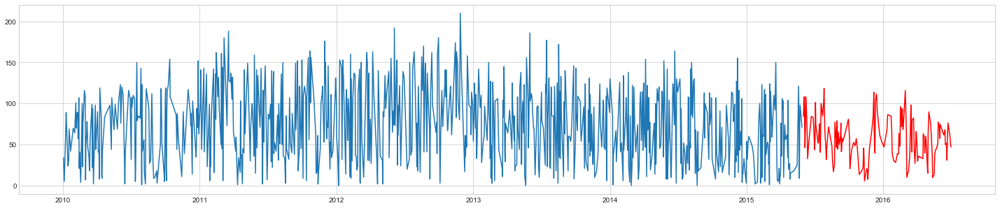

In [144]:
# Quick forecast for cloudy

fig = plt.figure(figsize=(25,5))
num_points = len(cloudy['Car_Count'])
x = results_ARIMA_diff_cloudy.predict(start=(867), end=(1019), dynamic=False)
x_ORG_cloudy = x + cloudy['Car_Count'].shift(1)

plt.plot(cloudy['Car_Count'][:867])
plt.plot(x_ORG_cloudy, color='red')

Again, this prediction looks to fit very well to the times series! *Happy*